In [46]:
printmd('Real Estate Analysis Capstone Regression Project')
printmd('US National and State level Models to predict monthly expenditure for home mortgage loans')
printmd('Aspects covered are Exploratory Data Analysis, Factor Analysis, Principal Component Analysis,\
 Debt Analysis, Population Analysis and Correlation Analysis')
printmd('3 National Level Models - Linear Regression, XGBoost Regression and Deep Neural Network')
printmd('Achieved R Squared values of 98.68 for Lin.Reg., 96.17 for XGB and 99.07 for Neural Network')
printmd('52 State Level Models of Linear Regression with avg. R Squared value of 93.22')
printmd('Tableau Dashboard and Worksheet screenshots included in the repository.')

## <span style="color:blue">Real Estate Analysis Capstone Regression Project</span>

## <span style="color:blue">US National and State level Models to predict monthly expenditure for home mortgage loans</span>

## <span style="color:blue">Aspects covered are Exploratory Data Analysis, Factor Analysis, Principal Component Analysis, Debt Analysis, Population Analysis and Correlation Analysis</span>

## <span style="color:blue">3 National Level Models - Linear Regression, XGBoost Regression and Deep Neural Network</span>

## <span style="color:blue">Achieved R Squared values of 98.68 for Lin.Reg., 96.17 for XGB and 99.07 for Neural Network</span>

## <span style="color:blue">52 State Level Models of Linear Regression with avg. R Squared value of 93.22</span>

## <span style="color:blue">Tableau Dashboard and Worksheet screenshots included in the repository.</span>

In [1]:
################################################################################################################################
# Import some of the required libraries like pandas, matplotlib,seaborn, numpy etc
################################################################################################################################
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown('## <span style="color:blue">'+string+'</span>'))
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
sns.set(style='whitegrid', palette='muted', font_scale=1.0)

In [3]:
################################################################################################################################
# read the input train csv file
################################################################################################################################
RE_train = pd.read_csv('./datasets/train.csv ')

In [4]:
################################################################################################################################
# read the input test file as well
################################################################################################################################
RE_test = pd.read_csv('./datasets/test.csv ')

In [5]:
################################################################################################################################
# check the shapes of the test and train files to know the number of rows and columns
################################################################################################################################
RE_train.shape, RE_test.shape

((27321, 80), (11709, 80))

In [6]:
################################################################################################################################
# look at the first 20 columns values of top 5 rows
################################################################################################################################
RE_train.iloc[0:2,0:20]

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop
0,267822,NaN,140,53,36,New York,NY,Hamilton,Hamilton,City,tract,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618
1,246444,NaN,140,141,18,Indiana,IN,South Bend,Roseland,City,tract,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284


In [7]:
################################################################################################################################
# look at the next 20 columns values of top 5 rows
################################################################################################################################
RE_train.iloc[0:2,20:40]

,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples
0,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0
1,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0


In [8]:
################################################################################################################################
# look at the next 20 columns values of top 5 rows
################################################################################################################################
RE_train.iloc[0:2,40:60]

,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf
0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658
1,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174


In [9]:
################################################################################################################################
# look at the remaining columns values of top 5 rows
################################################################################################################################
RE_train.iloc[0:2,60:]

,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.0,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.0877
1,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.0,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.0903


In [10]:
################################################################################################################################
# Remove all rows that have null values in hc_mortgage_mean as we don't use them in our model for prediction. They are loan rows
################################################################################################################################
RE_train=RE_train[~RE_train.filter(like='hc_mortgage_mean').isnull().any(1)] 
RE_train.shape   

(26748, 80)

In [11]:
################################################################################################################################
# to do the same on test file, first look at it shape to see how many will get dropped
################################################################################################################################
RE_test.shape

(11709, 80)

In [12]:
################################################################################################################################
# drop rows with null values in hc_mortgage_mean as we did for train dataset, and observe how many got dropped
################################################################################################################################
RE_test=RE_test[~RE_test.filter(like='hc_mortgage_mean').isnull().any(1)] 
RE_test.shape   

(11441, 80)

In [13]:
################################################################################################################################
# deleted the column BLOCKED all together as it is empty
################################################################################################################################
RE_train.drop(['BLOCKID'],axis=1,inplace=True)

In [14]:
################################################################################################################################
# extract all filed names that has null values from train dataset
################################################################################################################################
RE_NULL_COLS = [col for col in RE_train.columns if (RE_train[col].isnull().sum()!=0 )]

In [15]:
################################################################################################################################
# extract all rows that has null values
################################################################################################################################
RE_NULL_COL_DATA = RE_train[RE_NULL_COLS]

In [16]:
################################################################################################################################
# print the number of columns that has null values
################################################################################################################################
len(RE_NULL_COLS), RE_NULL_COL_DATA.shape, RE_NULL_COL_DATA.size, RE_train.size

(34, (26748, 34), 909432, 2113092)

In [17]:
printmd('Several fields from train and test files have null values; in limited number of rows though')

## <span style="color:blue">Several fields from train and test files have null values; in limited number of rows though</span>

In [18]:
################################################################################################################################
# Drop duplicate rows. Before that look at the shape one more time to see how many get deopped
################################################################################################################################
RE_train.shape

(26748, 79)

In [19]:
################################################################################################################################
# drop duplicate rows
################################################################################################################################
RE_train.drop_duplicates(inplace=True)

In [20]:
################################################################################################################################
# check the shape again to see how many got dropped
################################################################################################################################
RE_train.shape

(26719, 79)

In [21]:
################################################################################################################################
# check the unique values in UID colummn- if it has same unique values as number of rows, we can use it as an index column
################################################################################################################################
RE_train['UID'].nunique()

26719

In [22]:
printmd('UID field can be used as index as its nunique value equals number of rows in the file')

## <span style="color:blue">UID field can be used as index as its nunique value equals number of rows in the file</span>

In [23]:
################################################################################################################################
# Set UID as index to the dataset
################################################################################################################################
RE_train=RE_train.set_index('UID')

In [24]:
################################################################################################################################
# check the fill rate of columns that has nulll values
################################################################################################################################
for col in RE_NULL_COLS:
    print('        Fill rate of column', str.center(col, 28),  'with missing values is  ', round(1-(len(RE_train[col].dropna()) / len(RE_train)),4))

        Fill rate of column          rent_mean           with missing values is   0.001
        Fill rate of column         rent_median          with missing values is   0.001
        Fill rate of column          rent_stdev          with missing values is   0.001
        Fill rate of column      rent_sample_weight      with missing values is   0.001
        Fill rate of column         rent_samples         with missing values is   0.001
        Fill rate of column          rent_gt_10          with missing values is   0.001
        Fill rate of column          rent_gt_15          with missing values is   0.001
        Fill rate of column          rent_gt_20          with missing values is   0.001
        Fill rate of column          rent_gt_25          with missing values is   0.001
        Fill rate of column          rent_gt_30          with missing values is   0.001
        Fill rate of column          rent_gt_35          with missing values is   0.001
        Fill rate of column     

In [25]:
printmd('Fill rate of all fields with missing data is very low, almost equal to zero ')

## <span style="color:blue">Fill rate of all fields with missing data is very low, almost equal to zero </span>

In [26]:
################################################################################################################################
# extract fields with less unique values to impute in a different way than those with more unique values. 
################################################################################################################################
cols_with_low_unique=[]
cols = [col for col in RE_train.columns]
for col,type in RE_train.loc[:, cols].dtypes.iteritems():
    if ((RE_train[col].isnull().sum() != 0 ) & (RE_train[col].nunique() < 10000)):
        cols_with_low_unique.append(col)    
len(cols_with_low_unique)

9

In [27]:
################################################################################################################################
# extract fields with more unique values to impute in a different way than those with less unique values.
################################################################################################################################
cols_with_high_unique=[]
cols = [col for col in RE_train.columns]
for col,type in RE_train.loc[:, cols].dtypes.iteritems():
    if ((RE_train[col].isnull().sum() != 0 ) & (RE_train[col].nunique() >= 10000)):
        cols_with_high_unique.append(col) 
len(cols_with_high_unique)

25

In [28]:
################################################################################################################################
# Initially I thought of imputing by mean, meadian or mode way. But now decided to impute by backfill and forward fill instead
################################################################################################################################
for col in cols_with_low_unique:
    
    if RE_train[col].isnull().sum() != 0:
        
        RE_train[[col]] = RE_train[[col]].bfill()
        

In [29]:
################################################################################################################################
# Initially I thought of imputeing by mean, meadian or mode way. But now decided to impute by backfill and forward fill instead
################################################################################################################################
for col in cols_with_high_unique:
    
    if RE_train[col].isnull().sum() != 0:
        
        RE_train[[col]] = RE_train[[col]].ffill()
        

In [30]:
printmd('Exploratory Data Analysis (EDA): Debt Analysis part A - Geo maps')

## <span style="color:blue">Exploratory Data Analysis (EDA): Debt Analysis part A - Geo maps</span>

In [31]:
################################################################################################################################
# extract the required columns and rows into a new variable for convinience sake
################################################################################################################################
RE_train_SM = RE_train[['state','state_ab','lat','lng','zip_code','area_code', 'city', 'place', 'second_mortgage', 'pct_own']]

In [32]:
################################################################################################################################
# check the sahpe of the newly created varaible after extraction
################################################################################################################################
RE_train_SM.shape

(26719, 10)

In [33]:
################################################################################################################################
# filter/remove out rows that has percentage ownership less than 10%
################################################################################################################################
RE_train_SM = RE_train_SM[RE_train_SM['pct_own']>=0.1]
RE_train_SM.shape

(26262, 10)

In [34]:
################################################################################################################################
# sort and extract top 2500 locations with maximum second mortgage values, and look at the top 10 rows visually
################################################################################################################################
RE_train_SM_sort = RE_train_SM.sort_values('second_mortgage',ascending=False,ignore_index=True)
RE_train_SM_2500 = RE_train_SM_sort.head(2500)
print(RE_train_SM_2500.shape)
RE_train_SM_2500.head(2)

(2500, 10)


,state,state_ab,lat,lng,zip_code,area_code,city,place,second_mortgage,pct_own
0,Virginia,VA,37.297357,-78.396452,23901,434,Farmville,Farmville,0.50000,0.62069
1,Massachusetts,MA,42.254262,-71.800347,1610,508,Worcester,Worcester City,0.43363,0.20247


In [35]:
################################################################################################################################
# copy the data into another variable to extract data grouped by state
################################################################################################################################
RE_train_SM_2500_st = RE_train_SM_2500.copy()

In [36]:
################################################################################################################################
# do a groupby on state_ab and extract maximum second_mortgage and reset_index to have access to the state_ab values
################################################################################################################################
RE_train_SM_2500_st = RE_train_SM_2500_st.groupby(['state','state_ab']).max('second_mortgage').reset_index()
RE_train_SM_2500_st.shape

(51, 8)

In [37]:
################################################################################################################################
# look at top five rows after doing groupby state_ab
################################################################################################################################
RE_train_SM_2500_st.head(1)

,state,state_ab,lat,lng,zip_code,area_code,second_mortgage,pct_own
0,Alabama,AL,34.795563,-85.044212,36867,334,0.1224,0.93749


In [38]:
################################################################################################################################
# import the libraries for geomaping the data we extracted above
################################################################################################################################
import  plotly
import chart_studio
import chart_studio.plotly as py 
import plotly.graph_objs as go 
from plotly.offline import iplot

In [39]:
################################################################################################################################
# define the data dict choropleth giving locations,locationmode,color,text, z data and colorbar title
################################################################################################################################
data = dict(type='choropleth',
            locations = RE_train_SM_2500_st['state_ab'],
            locationmode = 'USA-states',
            colorscale = 'Greens_r',
            text = RE_train_SM_2500_st['state'],
            z = RE_train_SM_2500_st['second_mortgage'],
            colorbar = {'title':"Second Mortgage Ratio"}
            )

In [40]:
################################################################################################################################
# difine the layout dict giving title and geo scope
################################################################################################################################
%matplotlib inline
layout = dict(title = 'US States with households having second mortgage and ownership above 10%',
              geo = dict(scope='usa')
             )

In [41]:
################################################################################################################################
# assign values to choromap with geo object, data and layout defined above. Then plot it - state wise maximum values.
################################################################################################################################
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap,show_link=True,image='png')


In [42]:
################################################################################################################################
# now plot it by individual locations using scatter plot. Define data and layout as we did above and assign it to choromap
################################################################################################################################

data = go.Scattergeo(
        lon = RE_train_SM_2500['lng'],
        lat = RE_train_SM_2500['lat'],
        text = RE_train_SM_2500['state'],
        
        mode = 'markers',
        
        marker = dict(symbol = 'star',size=5,colorscale = 'pubugn_r'
                      ),
        marker_color = RE_train_SM_2500['second_mortgage'],
        )
layout = dict(title = 'Top 2500 US locations with households having second mortgage and ownership above 10%',
              geo_scope = 'usa'
             )
choromap = go.Figure(data = [data],layout = layout)


In [45]:
################################################################################################################################
# plot the choromap to have a scatter plot of individual locations with max second mortgage 
################################################################################################################################
iplot(choromap,show_link=True,image='png')


In [44]:
printmd('EDA: Debt analysis part B & C- Pie charts')

## <span style="color:blue">EDA: Debt analysis part B & C- Pie charts</span>

In [56]:
################################################################################################################################
# Part b of debt analysis -  extract required columns and rows for calculating overall debt, bad debt and so on into a variable
################################################################################################################################
RE_train_debt = RE_train[['state','city','debt', 'second_mortgage', 'home_equity', 'home_equity_second_mortgage']]
RE_train_GoodDebt= RE_train_debt[(RE_train_debt.second_mortgage <=0) & (RE_train_debt.home_equity <=0)]
RE_train_BadDebt= RE_train_debt[(RE_train_debt.second_mortgage >0) | (RE_train_debt.home_equity >0)]
RE_train_debt.shape,RE_train_GoodDebt.shape,RE_train_BadDebt.shape

((26719, 6), (1298, 6), (25421, 6))

In [57]:
################################################################################################################################
# create a new field Bad_debt in the new variable with (second_mortgage + home_equity - home_equity_second_mortgage) value
################################################################################################################################
def fun_bad_debt(row):
    debt= (row.second_mortgage + row.home_equity - row.home_equity_second_mortgage)
    return debt

RE_train_BadDebt['Bad_Debt']=RE_train_BadDebt.apply(lambda row: fun_bad_debt(row),axis=1) 


In [58]:
################################################################################################################################
# look at the top 5 rows to make sure it populated properly
################################################################################################################################
RE_train_BadDebt.head(1)

,state,city,debt,second_mortgage,home_equity,home_equity_second_mortgage,Bad_Debt
UID,,,,,,,
267822,New York,Hamilton,0.52963,0.02077,0.08919,0.01588,0.09408


In [59]:
################################################################################################################################
# prepare data to plot a pie chart with overall debt, bad debt, second_mortgage % and home equity %
################################################################################################################################
a=RE_train_GoodDebt.debt.sum()/RE_train_debt.debt.sum()
b=RE_train_BadDebt.debt.sum()/RE_train_debt.debt.sum()

d=RE_train_BadDebt.second_mortgage.sum()/(RE_train_BadDebt.second_mortgage.sum()+RE_train_BadDebt.home_equity.sum())
e=RE_train_BadDebt.home_equity.sum()/(RE_train_BadDebt.second_mortgage.sum()+RE_train_BadDebt.home_equity.sum())

f=d+e
c=a+b
c, a,b , f,d,e

(0.9999999999999999,
 0.03629175871775326,
 0.9637082412822466,
 0.9999999999999999,
 0.22889484636275995,
 0.77110515363724)

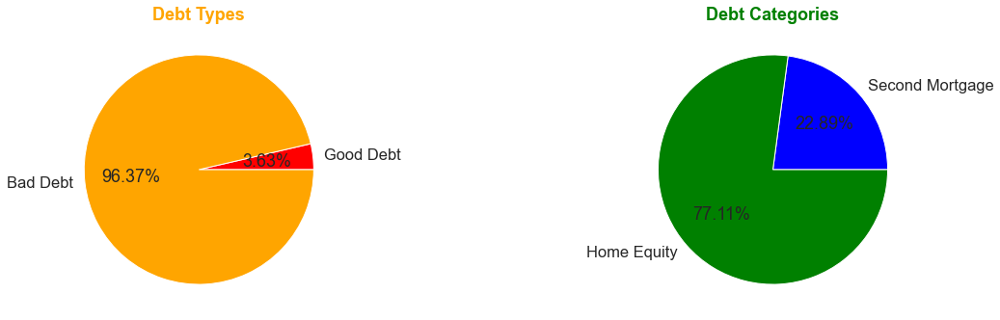

In [60]:
################################################################################################################################
# plot the pie charts of debt tyoes and debt catagories
################################################################################################################################
debt_labels=['Good Debt','Bad Debt']
debt_cat_labels=['Second Mortgage','Home Equity']
debt_type=[a,b]
debt_cat=[d,e]
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
plt.figure(figsize=(16, 6))
plt.subplots_adjust(wspace=1)
plt.subplot(1,2,1) 
plt.pie(debt_type,labels=debt_labels,autopct="%0.2f%%",colors=['red','orange'])
plt.title('Debt Types',color='orange',fontweight='bold')
plt.subplot(1,2,2) 
plt.pie(debt_cat,labels=debt_cat_labels,autopct="%0.2f%%",colors=['blue','green'])
plt.title('Debt Categories',color='green',fontweight='bold')
plt.show()

In [61]:
printmd('EDA: Debt analysis part D - Box and Whisker plots')

## <span style="color:blue">EDA: Debt analysis part D - Box and Whisker plots</span>

In [62]:
################################################################################################################################
# sort the good debt data by state
################################################################################################################################
RE_train_GoodDebt = RE_train_GoodDebt.sort_values('state')

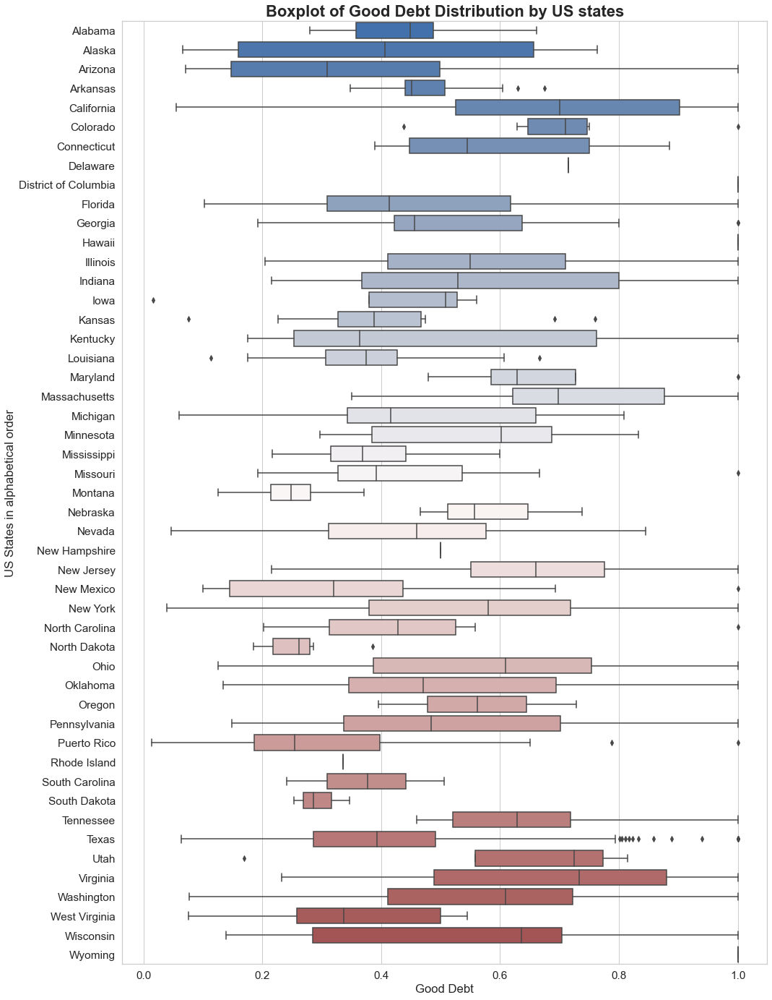

In [65]:
################################################################################################################################
# plot Good debt distribution by each state using Box and whisker plots 
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.4)
plt.figure(figsize=(16,24))
sns.boxplot(x='debt', y='state', 
                 data=RE_train_GoodDebt,orient='h',             
                 palette="vlag")
plt.ylabel('US States in alphabetical order') 
plt.xlabel('Good Debt') 
plt.title('Boxplot of Good Debt Distribution by US states',fontweight='bold',fontsize=22)
plt.show()

In [66]:
################################################################################################################################
# sort the bad debt by state wise
################################################################################################################################
RE_train_BadDebt = RE_train_BadDebt.sort_values('state')

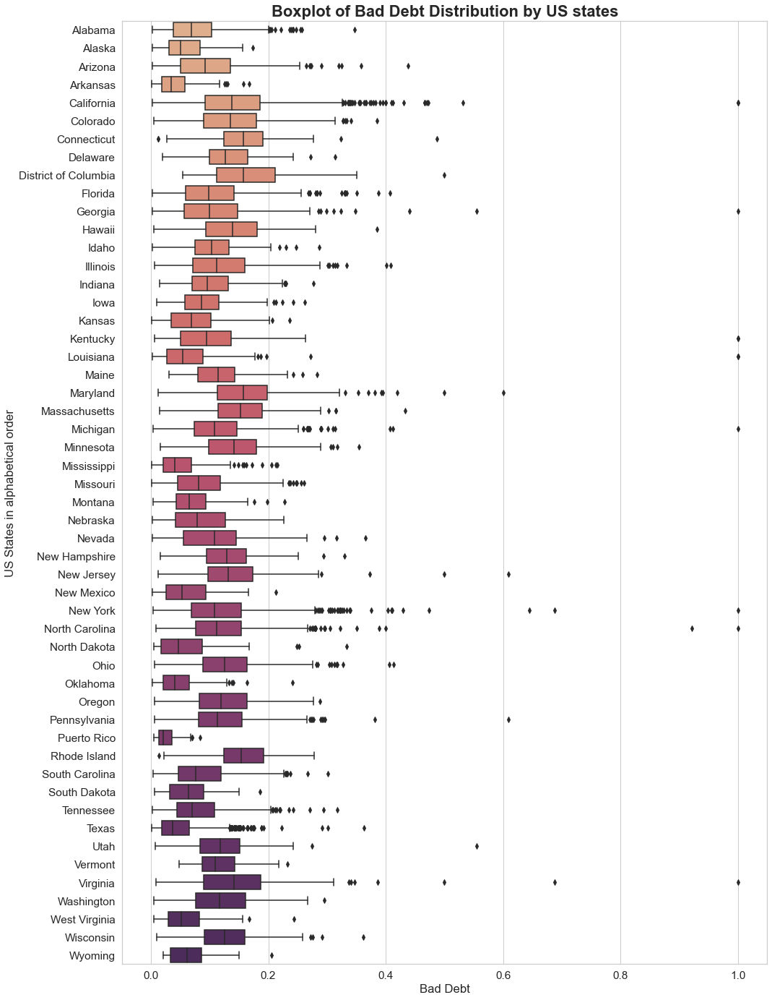

In [67]:
################################################################################################################################
# plot bad debt distribution by each state using Box and whisker plots 
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.4)
plt.figure(figsize=(16,24))
sns.boxplot(x='Bad_Debt', y='state', # whis=3,
                 data=RE_train_BadDebt,orient='h',             
                 palette="flare")
plt.ylabel('US States in alphabetical order') 
plt.xlabel('Bad Debt')                
plt.title('Boxplot of Bad Debt Distribution by US states',fontweight='bold',fontsize=22)
plt.show()

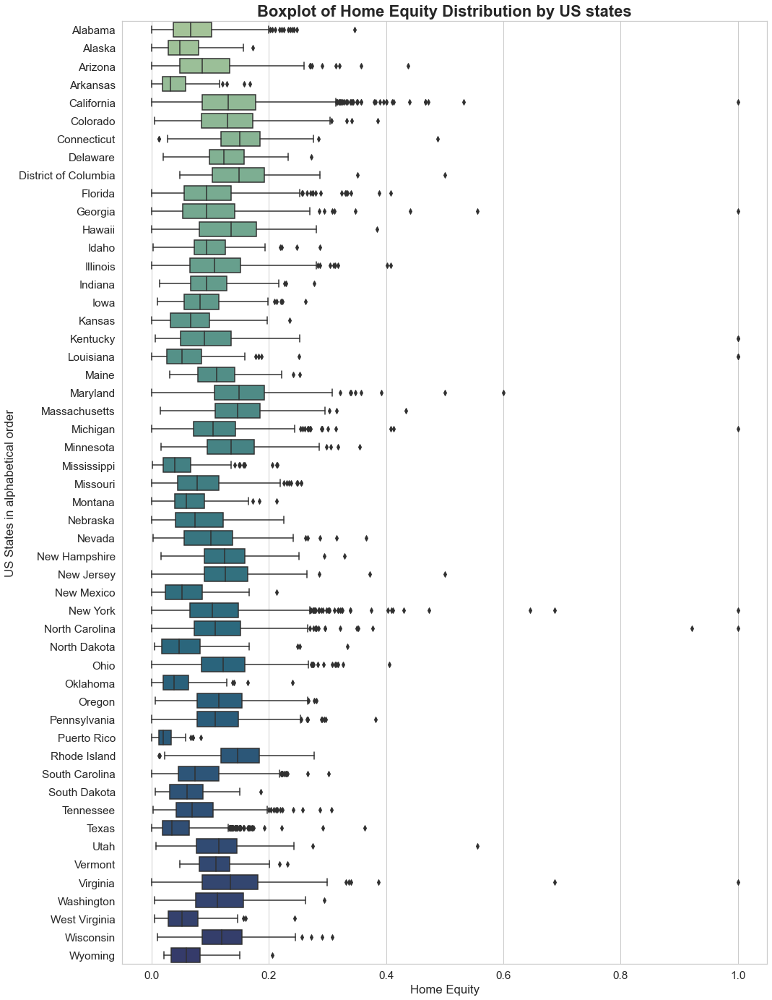

In [68]:
################################################################################################################################
# plot home equity debt distribution by each state using Box and whisker plots 
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.4)
plt.figure(figsize=(16,24))
sns.boxplot(x='home_equity', y='state', 
                 data=RE_train_BadDebt,orient='h',             
                 palette="crest")
plt.ylabel('US States in alphabetical order') 
plt.xlabel('Home Equity')                
plt.title('Boxplot of Home Equity Distribution by US states',fontweight='bold',fontsize=22)
plt.show()

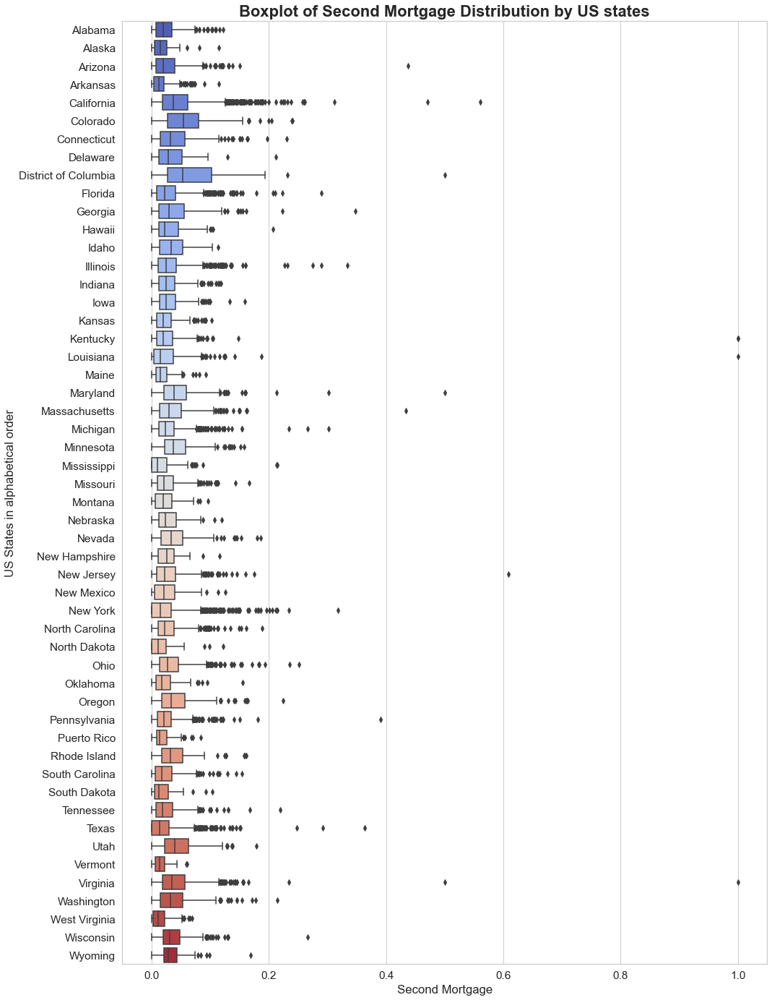

In [69]:
################################################################################################################################
# plot second mortgage debt distribution by each state using Box and whisker plots 
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.4)
plt.figure(figsize=(16,24))
sns.boxplot(x='second_mortgage', y='state', 
                 data=RE_train_BadDebt,orient='h',             
                 palette="coolwarm")
plt.ylabel('US States in alphabetical order') 
plt.xlabel('Second Mortgage')                  
plt.title('Boxplot of Second Mortgage Distribution by US states',fontweight='bold',fontsize=22)
plt.show()

In [70]:
printmd('EDA: Debt Analysis part E - Collated Income Distribution Chart')

## <span style="color:blue">EDA: Debt Analysis part E - Collated Income Distribution Chart</span>

In [71]:
################################################################################################################################
# Extract the required fields into a new variable
################################################################################################################################
RE_train_HFI = RE_train[['state','hi_mean','family_mean','rent_mean']]

In [72]:
################################################################################################################################
# create a new field to populate remaining income as family mean income - rent mean income
################################################################################################################################
def func_ri(row):
    ri = row.family_mean - row.rent_mean
    return ri

RE_train_HFI['ri_mean'] = RE_train_HFI.apply(lambda row: func_ri(row),axis=1 )

In [73]:
################################################################################################################################
# groupby the data extracted to populate all mean incomes
################################################################################################################################
RE_train_HFI_grp = RE_train_HFI.groupby('state')['hi_mean','family_mean','ri_mean'].mean()

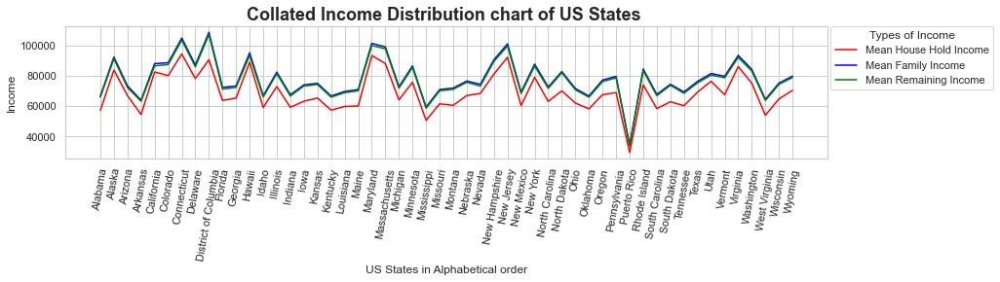

In [75]:
################################################################################################################################
# plot the line plots for each of the income values as collated chart
################################################################################################################################
plt.figure(figsize=(14,2.5))
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
sns.lineplot(data=RE_train_HFI_grp.hi_mean,label='Mean House Hold Income',color='red')  
sns.lineplot(data=RE_train_HFI_grp.family_mean,label='Mean Family Income',color='blue') 
sns.lineplot(data=RE_train_HFI_grp.ri_mean,label='Mean Remaining Income',color='green') 
plt.xticks(rotation=80)
plt.ylabel('Income')
plt.xlabel('US States in Alphabetical order')
plt.title('Collated Income Distribution chart of US States ',fontweight='bold',fontsize=18)
plt.legend(title='Types of Income',bbox_to_anchor=(0.725, .54, 0.5, 0.5))

plt.show()

In [76]:
printmd('EDA2: Population Analysis part 1')

## <span style="color:blue">EDA2: Population Analysis part 1</span>

In [77]:
################################################################################################################################
# extract the required fields, rename pop field as population and look at top 10 rows
################################################################################################################################
RE_train_PDA = RE_train[['pop','ALand','male_age_median', 'female_age_median', 'male_pop','female_pop',\
                         'married','separated','divorced']] 
RE_train_PDA.rename(columns={'pop':'population'},inplace=True)

In [78]:
################################################################################################################################
# create a new field as population_density to populate as population/ALand values
################################################################################################################################
def fun_pop_density(row):
    
    popd= (row.population/row.ALand)
    return popd

RE_train_PDA['population_density']=RE_train_PDA.apply(lambda row: fun_pop_density(row),axis=1) 


In [79]:
################################################################################################################################
# create new field median_age to populate it as below ( weighted average values)
################################################################################################################################
def fun_median_age(row):
    x=(row.male_pop/(row.male_pop+row.female_pop))
    y=(row.female_pop/(row.male_pop+row.female_pop))
    medAge= ((row.male_age_median * x + row.female_age_median * y)/(x+y))
    return medAge

RE_train_PDA['median_age']=RE_train_PDA.apply(lambda row: fun_median_age(row),axis=1) 


In [80]:
################################################################################################################################
# look at the top 2 rows of the newly created data
################################################################################################################################
RE_train_PDA.head(2)

,population,ALand,male_age_median,female_age_median,male_pop,female_pop,married,separated,divorced,population_density,median_age
UID,,,,,,,,,,,
267822,5230,202183361.0,44.0,45.33333,2612,2618,0.57851,0.01240,0.0877,0.000026,44.667430
246444,2633,1560828.0,32.0,37.58333,1349,1284,0.34886,0.01426,0.0903,0.001687,34.722748


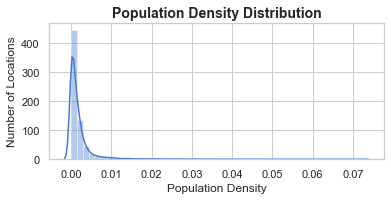

In [82]:
################################################################################################################################
# plot the distplot of the population density field values
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(6,2.5))
sns.distplot(RE_train_PDA['population_density'])
plt.title('Population Density Distribution',fontweight='bold',fontsize=14)
plt.xlabel('Population Density')
plt.ylabel('Number of Locations')
plt.show()

In [83]:
printmd('Population density is unevenly distributed; I believe few urban areas are heavily populated')

## <span style="color:blue">Population density is unevenly distributed; I believe few urban areas are heavily populated</span>

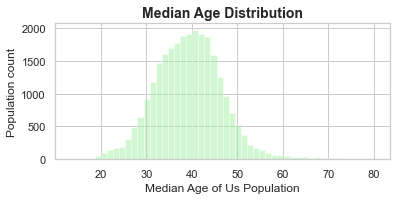

In [86]:
################################################################################################################################
# plot the median age distribution using distplot
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(6,2.5))
sns.distplot(RE_train_PDA['median_age'],color='lightgreen',norm_hist=False,kde=False)
plt.title('Median Age Distribution',fontweight='bold',fontsize=14)
plt.xlabel('Median Age of Us Population')
plt.ylabel('Population count')
plt.show()

In [87]:
printmd('Median age is Normally distributed. People with 40 years of age are high in numbers')

## <span style="color:blue">Median age is Normally distributed. People with 40 years of age are high in numbers</span>

In [88]:
printmd('EDA2: Population Analysis part 2')

## <span style="color:blue">EDA2: Population Analysis part 2</span>

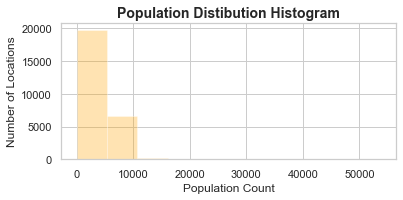

In [89]:
################################################################################################################################
# plot the histogram of the population distribution
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(6,2.5))
RE_train_PDA.population.hist(color='orange',alpha=.3)
plt.title('Population Distibution Histogram',fontweight='bold',fontsize=14)
plt.xlabel('Population Count')
plt.ylabel('Number of Locations')
plt.show()

In [90]:
################################################################################################################################
# print the population statistics mean, std, min, 25%,50%,75% and max values to use in creating bins
################################################################################################################################
RE_train_PDA.population.describe()

count    26719.000000
mean      4361.338149
std       2094.831851
min          4.000000
25%       2933.000000
50%       4074.000000
75%       5451.000000
max      53812.000000
Name: population, dtype: float64

In [91]:
################################################################################################################################
# create bins for the population with the sizes and labels as listed below
################################################################################################################################
RE_train_PDA['Population_bins'] = pd.cut(RE_train_PDA.population,[0,2400,3500,4700,6200,53813], \
                labels=['Very Low Population', 'Low Population', 'Medium Population','High Population','Very High Population'])

In [92]:
################################################################################################################################
# check the population bins have been created properly
################################################################################################################################
RE_train_PDA.Population_bins.unique()

['High Population', 'Low Population', 'Very High Population', 'Very Low Population', 'Medium Population']
Categories (5, object): ['Very Low Population' < 'Low Population' < 'Medium Population' < 'High Population' < 'Very High Population']

In [93]:
################################################################################################################################
# populate the rows with nan values into  'very low population bin'
################################################################################################################################
RE_train_PDA.Population_bins = RE_train_PDA.Population_bins.fillna('Very Low Population')

In [94]:
################################################################################################################################
# look if the bins has been balanced properly or not
################################################################################################################################
RE_train_PDA.Population_bins.value_counts()

Medium Population       6714
Low Population          5899
High Population         5853
Very High Population    4195
Very Low Population     4058
Name: Population_bins, dtype: int64

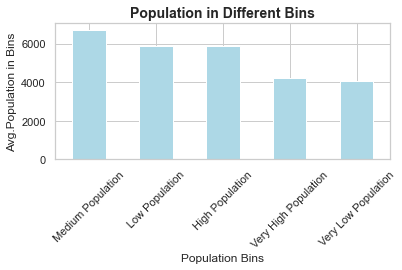

In [95]:
################################################################################################################################
# visually look at the bin value counts using bar chart
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(6,2.5))
RE_train_PDA.Population_bins.value_counts().plot(kind='bar',color='lightblue')
plt.xlabel('Population Bins')
plt.ylabel('Avg.Population in Bins')
plt.xticks(rotation=45)
plt.title('Population in Different Bins',fontweight='bold',fontsize=14)
plt.show()

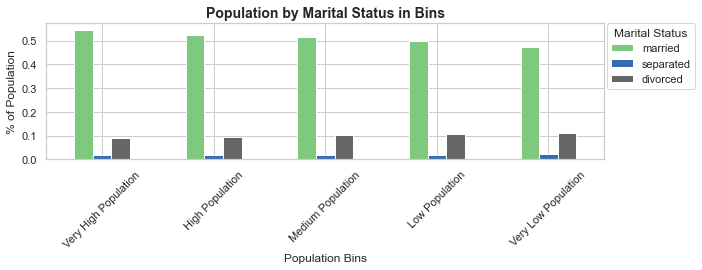

In [96]:
################################################################################################################################
# Bins and marital status relationship by average values
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
RE_train_PDA_bins_MSD=RE_train_PDA.groupby('Population_bins').mean()[['married','separated','divorced']]
RE_train_PDA_bins_MSD.sort_values(by='married',ascending=False).plot(kind='bar',colormap=plt.cm.Accent,figsize=(10,2.5))
plt.title('Population by Marital Status in Bins',fontweight='bold',fontsize=14)
plt.ylabel('% of Population')
plt.xlabel('Population Bins')
plt.xticks(rotation=45)
plt.legend(title='Marital Status',bbox_to_anchor=(0.673, .54, 0.5, 0.5))
plt.show()

In [97]:
################################################################################################################################
# look at the data's top 5 rows to see how the bins has been created
################################################################################################################################
RE_train_PDA.iloc[0:3,2:]

,male_age_median,female_age_median,male_pop,female_pop,married,separated,divorced,population_density,median_age,Population_bins
UID,,,,,,,,,,
267822,44.00000,45.33333,2612,2618,0.57851,0.01240,0.08770,0.000026,44.667430,High Population
246444,32.00000,37.58333,1349,1284,0.34886,0.01426,0.09030,0.001687,34.722748,Low Population
245683,40.83333,42.83333,3643,3238,0.64745,0.01607,0.10657,0.000099,41.774472,Very High Population


In [98]:
printmd(' EDA2: Analysis of Rent ')

## <span style="color:blue"> EDA2: Analysis of Rent </span>

In [99]:
################################################################################################################################
# extract the required fields into a seperate field, rename pop column to population, and look at the top 2 rows
################################################################################################################################
RE_train_Rent =RE_train[['STATEID','state','pop','rent_mean','hi_mean','family_mean','rent_gt_10','rent_gt_15','rent_gt_20','rent_gt_25','rent_gt_30',\
'rent_gt_35','rent_gt_40','rent_gt_50']]

RE_train_Rent.rename(columns={'pop':'population'},inplace=True)

In [100]:
################################################################################################################################
# calculate the overall mean rent
################################################################################################################################
overall_mean_rent = RE_train_Rent.rent_mean.mean()

In [101]:
################################################################################################################################
# calculate the overall mean house hold income
################################################################################################################################
overall_mean_hi = RE_train_Rent.hi_mean.mean()

In [102]:
################################################################################################################################
# find the ratio of overall rent to overall income
################################################################################################################################
overall_rent_by_hi = overall_mean_rent/overall_mean_hi
overall_rent_by_hi

0.014929189973111242

In [103]:
################################################################################################################################
# calculate the mean rent for each state and populate in a new field states_rent_mean  
################################################################################################################################
RE_train_Rent['states_rent_mean'] = RE_train_Rent.groupby('state').rent_mean.transform('mean')

In [104]:
################################################################################################################################
# calculate the mean h income for each state and populate in a new field states_hi_mean 
################################################################################################################################
RE_train_Rent['states_hi_mean'] = RE_train_Rent.groupby('state').hi_mean.transform('mean')

In [105]:
################################################################################################################################
# calculate the ratio of rent by hi for each state and populate in a field states_rent_by_hi_mean
################################################################################################################################
def func_rent_by_hi(row):
    states_rent_by_hi_mean = row.states_rent_mean/row.states_hi_mean
    return states_rent_by_hi_mean

RE_train_Rent['states_rent_by_hi_mean'] = RE_train_Rent.apply(lambda row: func_rent_by_hi(row),axis=1)

In [106]:
################################################################################################################################
# prepare data to plot rent by house hold income for each state 
################################################################################################################################
RE_train_RHI=RE_train_Rent[['state','states_hi_mean','states_rent_mean']] 
RE_train_RHI=RE_train_RHI.drop_duplicates()

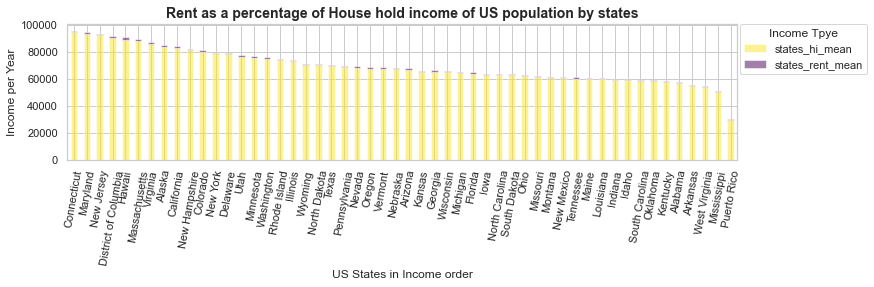

In [107]:
################################################################################################################################
# set the state as index to the newly created field and plot the stacked bar chart of rent and household income
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
RE_train_RHI=RE_train_RHI.set_index('state')
RE_train_RHI.sort_values(by='states_hi_mean',ascending=False).plot(figsize=(12,2.5),\
                                                                   colormap=plt.cm.viridis_r,alpha=.5,kind='bar',stacked=True)
plt.ylabel('Income per Year')
plt.xticks(rotation=80)
plt.xlabel('US States in Income order')
plt.title('Rent as a percentage of House hold income of US population by states',fontweight='bold',fontsize=14)
plt.legend(title='Income Tpye',bbox_to_anchor=(0.703, .54, 0.5, 0.5))
plt.show()

In [108]:
printmd('Rent is a minor income source for US households')

## <span style="color:blue">Rent is a minor income source for US households</span>

In [109]:
printmd('EDA2: Part 4 - Correlation Analysis ')

## <span style="color:blue">EDA2: Part 4 - Correlation Analysis </span>

In [110]:
################################################################################################################################
# extract the required variables for performing the correlation analysis
################################################################################################################################
RE_train_CA =RE_train[['STATEID','pop','rent_mean','hi_mean','family_mean','hc_mortgage_mean','hc_mean',\
                       'divorced','separated','married','pct_own','hs_degree','debt','home_equity','second_mortgage',\
                       'home_equity_second_mortgage']]

In [111]:
################################################################################################################################
# import the MinMaxScaler to standardize the data
################################################################################################################################
from sklearn.preprocessing import MinMaxScaler

In [112]:
################################################################################################################################
# instantiate the MinMaxScaler
################################################################################################################################
scaler = MinMaxScaler()

In [113]:
################################################################################################################################
# fit transform the data for coreelation analysis
################################################################################################################################
RE_train_CA_scaled = scaler.fit_transform(RE_train_CA)

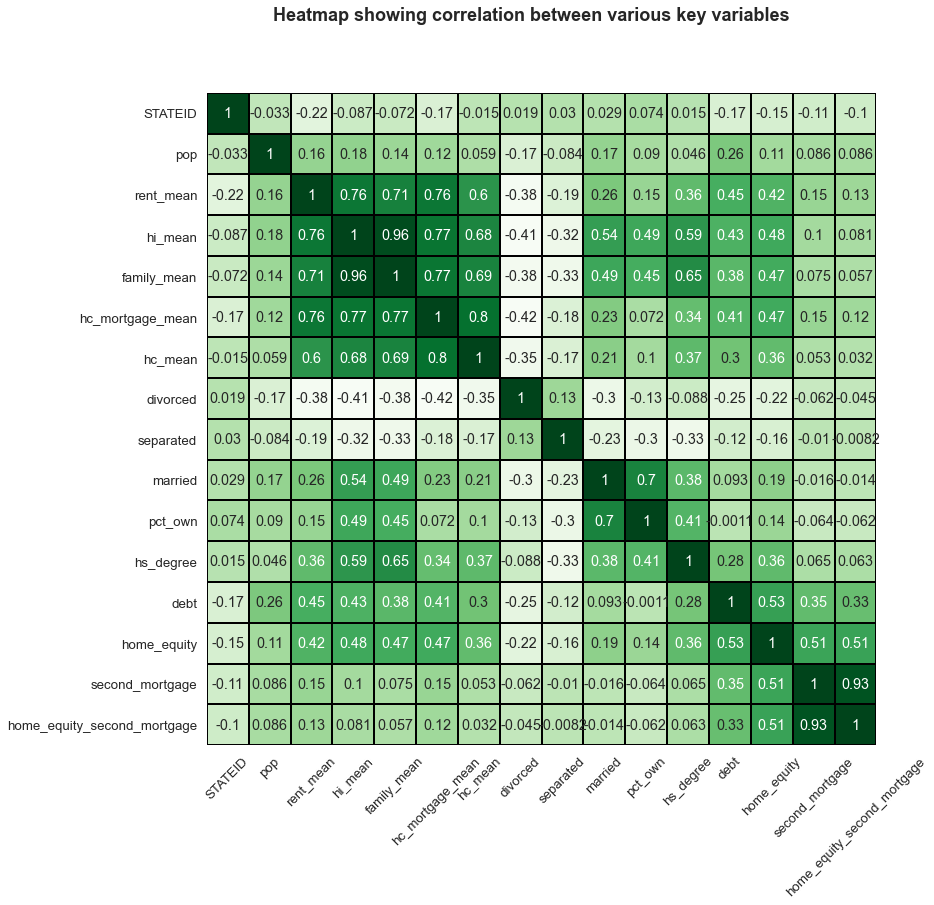

In [115]:
################################################################################################################################
# execute the correlation function on the standardized data, and plot the heatmap of that data
################################################################################################################################
corr = RE_train_CA.corr()
plt.figure(figsize=(12,12))
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
sns.heatmap(corr,annot=True,cbar=False,fmt='.2g',cmap=plt.cm.Greens,
    linewidths=2,
    linecolor='black')
plt.suptitle('Heatmap showing correlation between various key variables',fontweight='bold',fontsize=18)
plt.xticks(rotation=45)
plt.show()

In [116]:
printmd('second_mortgage and home_equity_second_mortgage are highly correlated')
printmd('rent_mean, hi_mean,family_mean ,hc_mortgage_mean and hc_mean are highly correlated')
printmd('married and pct_own are coupled')
printmd('hs_degree, hi_mean and family_mean are coupled')
printmd('divorced,seperated has negative relationship with hi_mean and family_mean')
printmd('second_mortgage, home_equity and home_equity_second_mortgage are correlated with a significant value')
printmd('debt, rent_mean, hi_mean, family_mean,home_equity, second_mortgage and hc_mortgage_mean are coupled ')

## <span style="color:blue">second_mortgage and home_equity_second_mortgage are highly correlated</span>

## <span style="color:blue">rent_mean, hi_mean,family_mean ,hc_mortgage_mean and hc_mean are highly correlated</span>

## <span style="color:blue">married and pct_own are coupled</span>

## <span style="color:blue">hs_degree, hi_mean and family_mean are coupled</span>

## <span style="color:blue">divorced,seperated has negative relationship with hi_mean and family_mean</span>

## <span style="color:blue">second_mortgage, home_equity and home_equity_second_mortgage are correlated with a significant value</span>

## <span style="color:blue">debt, rent_mean, hi_mean, family_mean,home_equity, second_mortgage and hc_mortgage_mean are coupled </span>

In [117]:
printmd('End of Exploratory Data Analysis.')

## <span style="color:blue">End of Exploratory Data Analysis.</span>

In [118]:
printmd('Start of Data Preprocessing.')

## <span style="color:blue">Start of Data Preprocessing.</span>

In [119]:
################################################################################################################################
# drop the BLOCKED field as it has no data from the test file as we did for the training dataset
################################################################################################################################
RE_test.drop(['BLOCKID'],axis=1,inplace=True)

In [120]:
################################################################################################################################
# extarct column names of columns with null values from the test dataset
################################################################################################################################
RE_NULL_COLS = [col for col in RE_test.columns if (RE_test[col].isnull().sum()!=0 )]
RE_NULL_COL_DATA = RE_test[RE_NULL_COLS]
len(RE_NULL_COLS)


29

In [121]:
################################################################################################################################
# check the shape of the test dataset before droping the duplicate rows for comparision sake
################################################################################################################################
RE_test.shape

(11441, 79)

In [122]:
################################################################################################################################
# drop duplicates from test dataset
################################################################################################################################
RE_test.drop_duplicates(inplace=True)
RE_test.shape


(11432, 79)

In [123]:
################################################################################################################################
# set the UID field as index as we did for the training dataset
################################################################################################################################
RE_test=RE_test.set_index('UID')

In [124]:
################################################################################################################################
# find the null fill rate of columns with null values 
################################################################################################################################
for col in RE_NULL_COLS:
    print('        Fill rate of column', str.center(col, 28),  'with missing values is  ',\
          round(1-(len(RE_test[col].dropna()) / len(RE_test)),4))

        Fill rate of column          rent_mean           with missing values is   0.0017
        Fill rate of column         rent_median          with missing values is   0.0017
        Fill rate of column          rent_stdev          with missing values is   0.0017
        Fill rate of column      rent_sample_weight      with missing values is   0.0017
        Fill rate of column         rent_samples         with missing values is   0.0017
        Fill rate of column          rent_gt_10          with missing values is   0.0017
        Fill rate of column          rent_gt_15          with missing values is   0.0017
        Fill rate of column          rent_gt_20          with missing values is   0.0017
        Fill rate of column          rent_gt_25          with missing values is   0.0017
        Fill rate of column          rent_gt_30          with missing values is   0.0017
        Fill rate of column          rent_gt_35          with missing values is   0.0017
        Fill rate of 

In [125]:
printmd('Fill rate of testing dataset is also very low; as it was with the training dataset')

## <span style="color:blue">Fill rate of testing dataset is also very low; as it was with the training dataset</span>

In [126]:
################################################################################################################################
# initially i thought of imputeing by mean, median and mode way; but later decided to impute as backfill and forwardfill
# separate columns with nulls and less than 10000 unique values
################################################################################################################################
cols_with_low_unique=[]
cols = [col for col in RE_test.columns]
for col,type in RE_test.loc[:, cols].dtypes.iteritems():
    if ((RE_test[col].isnull().sum() != 0 ) & (RE_test[col].nunique() < 10000)):
        cols_with_low_unique.append(col)    
len(cols_with_low_unique)


16

In [127]:
################################################################################################################################
# extract columns with nulls and more than 10000 unique values
################################################################################################################################
cols_with_high_unique=[]
cols = [col for col in RE_test.columns]
for col,type in RE_test.loc[:, cols].dtypes.iteritems():
    if ((RE_test[col].isnull().sum() != 0 ) & (RE_test[col].nunique() >= 10000)):
        cols_with_high_unique.append(col) 
len(cols_with_high_unique)


13

In [128]:
################################################################################################################################
# impute low unique columns with backfill and high unique value columns with forwardfill - no specific reason 
################################################################################################################################
for col in cols_with_low_unique:
    
    if RE_test[col].isnull().sum() != 0:
        
        RE_test[[col]] = RE_test[[col]].bfill()
        
        
for col in cols_with_high_unique:
    
    if RE_test[col].isnull().sum() != 0:
        
        RE_test[[col]] = RE_test[[col]].ffill()


In [129]:
################################################################################################################################
# extract the catagory columns for label encoding to fit for machine learning model building
################################################################################################################################
objcols = RE_train.select_dtypes(exclude=np.number).columns 


In [130]:
################################################################################################################################
# instantiate different label encoder for different fields
################################################################################################################################
from sklearn.preprocessing import LabelEncoder

le_state    = LabelEncoder()
le_state_ab = LabelEncoder()
le_city     = LabelEncoder()
le_place    = LabelEncoder()
le_type     = LabelEncoder()
le_primary  = LabelEncoder() 

################################################################################################################################
# fit the label encoders with training dataset fields for respective encoder
################################################################################################################################


le_state.fit(RE_train.state)
le_state_ab.fit(RE_train.state_ab)
le_city.fit(RE_train.city)
le_place.fit(RE_train.place)
le_type.fit(RE_train.type)
le_primary.fit(RE_train.primary)

################################################################################################################################
# transform the label encoder on train dataset fields 
################################################################################################################################

RE_train.state       = le_state.transform(RE_train.state)
RE_train.state_ab    = le_state_ab.transform(RE_train.state_ab)
RE_train.city        = le_city.transform(RE_train.city)
RE_train.place       = le_place.transform(RE_train.place)
RE_train.type        = le_type.transform(RE_train.type)
RE_train.primary     = le_primary.transform(RE_train.primary)

In [131]:
################################################################################################################################
# there could be new/unseen labels in test dataset, which could error while encoding. To avoid that we check if there are any
# unseen labels in test dataset. If there are, then replace it with 'other' value.
################################################################################################################################
RE_test['state']     = RE_test['state'].map(lambda s: 'other' if s not in le_state.classes_ else s)
RE_test['state_ab']  = RE_test['state_ab'].map(lambda s: 'other' if s not in le_state_ab.classes_ else s)
RE_test['city']      = RE_test['city'].map(lambda s: 'other' if s not in le_city.classes_ else s)
RE_test['place']     = RE_test['place'].map(lambda s: 'other' if s not in le_place.classes_ else s)
RE_test['type']      = RE_test['type'].map(lambda s: 'other' if s not in le_type.classes_ else s)
RE_test['primary']   = RE_test['primary'].map(lambda s: 'other' if s not in le_primary.classes_ else s)


################################################################################################################################
# Add the 'other' value to all label encoding instances
################################################################################################################################

le_state.classes_    = np.append(le_state.classes_, 'other')
le_state_ab.classes_ = np.append(le_state_ab.classes_, 'other')
le_city.classes_     = np.append(le_city.classes_, 'other')
le_place.classes_    = np.append(le_place.classes_, 'other')
le_type.classes_     = np.append(le_type.classes_, 'other')
le_primary.classes_  = np.append(le_primary.classes_, 'other')

In [132]:
################################################################################################################################
# now run the label encoding transform on the test dataset fields 
################################################################################################################################
RE_test.state       = le_state.transform(RE_test.state)
RE_test.state_ab    = le_state_ab.transform(RE_test.state_ab)
RE_test.city        = le_city.transform(RE_test.city)
RE_test.place       = le_place.transform(RE_test.place)
RE_test.type        = le_type.transform(RE_test.type)
RE_test.primary     = le_primary.transform(RE_test.primary)

In [133]:
################################################################################################################################
# check null values in any of the columns in test dataset one last time
################################################################################################################################
for col in RE_test.columns:
    
    if RE_test[col].isnull().sum() != 0:
        print('col:',col)

In [134]:
printmd('Factor Analysis')

## <span style="color:blue">Factor Analysis</span>

In [135]:
################################################################################################################################
# import the factor analyser module
################################################################################################################################
from factor_analyzer import FactorAnalyzer

In [136]:
################################################################################################################################
# standardize the file factor Analysis 
################################################################################################################################
scaler = MinMaxScaler()
scaler.fit(RE_train)
RE_train_scaled= scaler.transform(RE_train)


In [137]:
################################################################################################################################
# let us perform the Bartlett’s test for the full training dataset
################################################################################################################################
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(RE_train_scaled)
chi_square_value, p_value

(nan, nan)

In [138]:
################################################################################################################################
# Above test failed. let us perform Kaiser-Meyer-Olkin (KMO) Test 
# KMO test too has values nan. so we can't go ahead with the factor analysis on whole dataset as it has all nan in both tests
################################################################################################################################
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(RE_train_scaled)
kmo_model

nan

In [139]:
printmd("No Factor analysis on full data as Bartlett’s and Kaiser-Meyer-Olkin(KMO) results have nulls")


## <span style="color:blue">No Factor analysis on full data as Bartlett’s and Kaiser-Meyer-Olkin(KMO) results have nulls</span>

In [140]:
printmd('Factor Analysis limited to below 6 key variables will be done in place of full dataset')
printmd('var:hs_degree, male_age_median, female_age_median, second_mortgage, pct_own and debt')

## <span style="color:blue">Factor Analysis limited to below 6 key variables will be done in place of full dataset</span>

## <span style="color:blue">var:hs_degree, male_age_median, female_age_median, second_mortgage, pct_own and debt</span>

In [141]:
################################################################################################################################
# extract the above mentioned fields for Factor Analysis
################################################################################################################################
RE_train_FA = RE_train[['hs_degree','male_age_median','female_age_median','second_mortgage','pct_own','debt']]


In [142]:
################################################################################################################################
# Perform the Bartlett’s test to see if data is suitable for Factor Analysis, by importing the required module
################################################################################################################################
chi_square_value,p_value=calculate_bartlett_sphericity(RE_train_FA)
chi_square_value, p_value

(57302.451693417, 0.0)

In [143]:
################################################################################################################################
# as the above test failed, let us run another test: Kaiser-Meyer-Olkin (KMO) Test to see if data is suitable for FA
################################################################################################################################
kmo_all,kmo_model=calculate_kmo(RE_train_FA)
kmo_model

0.6763698618952744

In [144]:
################################################################################################################################
# The KMO test has value more than 6 in KMO_MODEL so we can go ahead with the factor analysis
# so, let us Create factor analysis object and perform factor analysis. Try for 6 factors and see how many will be suitable 
################################################################################################################################
fa = FactorAnalyzer()
fa.fit_transform(RE_train_FA, 6)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()


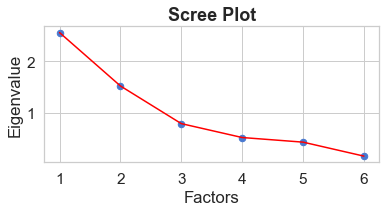

In [147]:
################################################################################################################################
# usually eigen values above 1 are considered good factors
# let us plot the scree plot using matplotlib to see how they are
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.4)

plt.figure(figsize=(6,2.5))
plt.scatter(range(1,RE_train_FA.shape[1]+1),ev,s=42)
plt.plot(range(1,RE_train_FA.shape[1]+1),ev,color='red')
plt.title('Scree Plot',fontweight='bold',fontsize=18)
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

In [148]:
################################################################################################################################
# see how many factors the factor analyzer has choosen as suitable
################################################################################################################################
fa.n_factors  # only factor with eigen values greater than or near 1 will be considered

3

In [149]:
################################################################################################################################
# Create factor analysis object and perform factor analysis; roration as varimax, and fit_transform for 3 factors 
# then print the loadings for each of the input variable for all 3 factors
################################################################################################################################
fa = FactorAnalyzer()
fa.rotation="varimax"
a=fa.fit_transform(RE_train_FA, 3 )

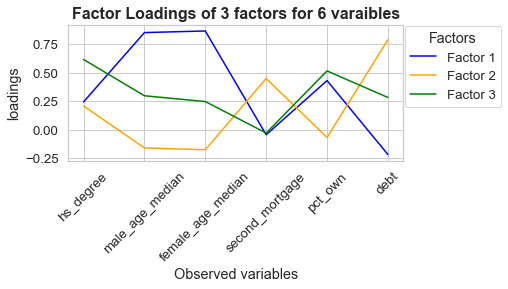

In [151]:
################################################################################################################################
# plot the 3 factor loadings for all input variables
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
plt.figure(figsize=(6,2.5))
columns=['hs_degree','male_age_median','female_age_median','second_mortgage','pct_own','debt']
plt.plot(columns,fa.loadings_[:,0],color='blue',label='Factor 1')
plt.plot(columns,fa.loadings_[:,1],color='orange',label='Factor 2')
plt.plot(columns,fa.loadings_[:,2],color='green',label='Factor 3')
plt.title('Factor Loadings of 3 factors for 6 varaibles',fontweight='bold',fontsize=16)
plt.xlabel('Observed variables')
plt.ylabel('loadings')
plt.xticks(rotation=45)
plt.legend(title='Factors',bbox_to_anchor=(0.8125, .54, 0.5, 0.5))
plt.show()

In [152]:
printmd('Factor 1 has high loadings for male_age_median, female_age_median and pct_own')
printmd('Factor 2 has high loadings for debt and second_mortgage')
printmd('Factor 3 has high loadings for hs_degree and pct_own')

## <span style="color:blue">Factor 1 has high loadings for male_age_median, female_age_median and pct_own</span>

## <span style="color:blue">Factor 2 has high loadings for debt and second_mortgage</span>

## <span style="color:blue">Factor 3 has high loadings for hs_degree and pct_own</span>

In [153]:
################################################################################################################################
# let us look at the varaince in factors.
# row1 SS Loadins, row 2 proportion variance, row 3 cummulative variance
################################################################################################################################
fa_var=fa.get_factor_variance()  
fa_var

(array([1.75817299, 0.92296163, 0.87056982]),
 array([0.29302883, 0.15382694, 0.14509497]),
 array([0.29302883, 0.44685577, 0.59195074]))

In [154]:
printmd('3 factors have the cummulative variance of 59%') 

## <span style="color:blue">3 factors have the cummulative variance of 59%</span>

In [155]:
printmd('Principal Component Analysis')

## <span style="color:blue">Principal Component Analysis</span>

In [156]:
################################################################################################################################
# prepare data for machine learning. seperate faetures and target variables
################################################################################################################################
Xtrain = RE_train.drop(['hc_mortgage_mean'],axis=1)
ytrain = RE_train['hc_mortgage_mean']
Xtrain.shape, ytrain.shape

((26719, 77), (26719,))

In [157]:
################################################################################################################################
# similarly do that for test dataset
################################################################################################################################
Xtest = RE_test.drop(['hc_mortgage_mean'],axis=1)
ytest = RE_test['hc_mortgage_mean']
Xtest.shape, ytest.shape

((11432, 77), (11432,))

In [158]:
################################################################################################################################
# prepare to standardize the training and testing features; fit on trainfeatures and transform on both datasets
################################################################################################################################
scaler = MinMaxScaler()
scaler.fit(Xtrain)
xtrain_scaled= scaler.transform(Xtrain)
xtest_scaled= scaler.transform(Xtest)

In [159]:
################################################################################################################################
# before performing PRINCIPAL COMPONENT ANALYSIS, look at the shape of the features file of train and test
################################################################################################################################
xtrain_scaled.shape, xtest_scaled.shape

((26719, 77), (11432, 77))

In [160]:
################################################################################################################################
# import the PCA module
################################################################################################################################
from sklearn.decomposition import PCA

In [161]:
################################################################################################################################
# instantiate the PCA to capture 99% of varaiance 
################################################################################################################################
pca = PCA(n_components=.99)

In [162]:
################################################################################################################################
# fit the PCA on the scaled train datasest
################################################################################################################################
pca.fit(xtrain_scaled)

PCA(n_components=0.99)

In [163]:
################################################################################################################################
# transform the PCA on train and test scaled files, and see how many components it returns that capture 99% varaiance
################################################################################################################################
xtestPCA = pca.transform(xtest_scaled)
xtrainPCA = pca.transform(xtrain_scaled)
xtestPCA.shape, xtrainPCA.shape

((11432, 37), (26719, 37))

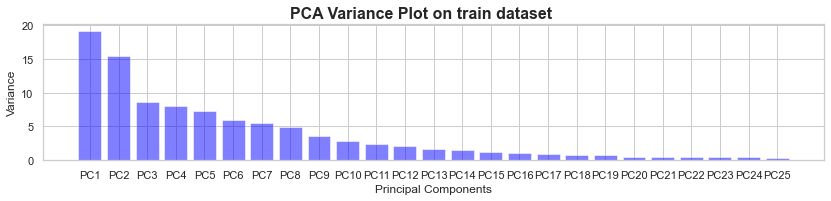

In [165]:
################################################################################################################################
# plot the Principal component variance on the train dataset only 25 components out of 37
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(14,2.5))
percent_variance = np.round(pca.explained_variance_ratio_* 100, decimals =2)
columns = ['PC1', 'PC2', 'PC3', 'PC4','PC5','PC6','PC7','PC8','PC9','PC10',
           'PC11', 'PC12', 'PC13', 'PC14','PC15','PC16','PC17','PC18','PC19','PC20',
           'PC21', 'PC22', 'PC23', 'PC24','PC25']
plt.bar(x= range(1,26), height=percent_variance[0:25], 
        alpha=.5,tick_label=columns,color='blue')
plt.ylabel('Variance')
plt.xlabel('Principal Components')
plt.suptitle('PCA Variance Plot on train dataset',fontweight='bold',fontsize=16)
plt.show()


In [166]:
printmd('End of Data Pre Processing and PCA' )
printmd('Start of Machine Learning Model Building and Evaluation')

## <span style="color:blue">End of Data Pre Processing and PCA</span>

## <span style="color:blue">Start of Machine Learning Model Building and Evaluation</span>

In [167]:
printmd('Linear Regression Model')

## <span style="color:blue">Linear Regression Model</span>

In [168]:
################################################################################################################################
# Import the linear regression module
################################################################################################################################
from sklearn.linear_model import LinearRegression

In [169]:
################################################################################################################################
# Instantiate the linearRegrssion module
################################################################################################################################
linearReg = LinearRegression()

In [170]:
################################################################################################################################
# fir the linear regression model on Train dataset with PCA and ytrain (target)
################################################################################################################################
linearReg.fit(xtrainPCA,ytrain)


LinearRegression()

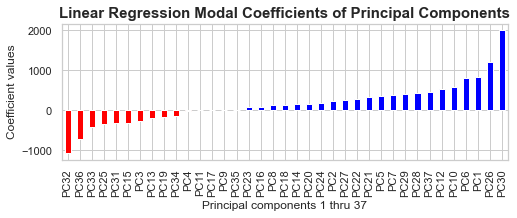

In [174]:
################################################################################################################################
# plot the graph of coeff. of 37 Principal components used in the model - see which has positive relation and which negative rel
################################################################################################################################
plt.figure(figsize=(8,2.5))
x=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18',\
'PC19','PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30','PC31','PC32','PC33','PC34','PC35','PC36',\
  'PC37']
predictors = x
coef1 = pd.Series(linearReg.coef_,predictors).sort_values()
features = pd.DataFrame()
features['importance'] = coef1
features['positive'] = features['importance'] > 0
coef1.plot(kind='bar', color=features.positive.map({True:'blue', False:'red'}))
plt.title('Linear Regression Modal Coefficients of Principal Components',fontweight='bold',fontsize=15)
plt.ylabel('Coefficient values')
plt.xlabel('Principal components 1 thru 37')
plt.show()

In [175]:
################################################################################################################################
# calculate the score /r2 value on the train data
################################################################################################################################
print('R Squared value of train data is ',np.round(linearReg.score(xtrainPCA,ytrain)*100,2))

R Squared value of train data is  98.74


In [176]:
################################################################################################################################
# calculate the score /r2 value on the test data
################################################################################################################################
print('R Squared value of test data is ',np.round(linearReg.score(xtestPCA,ytest)*100,2))

R Squared value of test data is  98.68


In [177]:
################################################################################################################################
# import the regression metrics modules
################################################################################################################################
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, r2_score

In [178]:
################################################################################################################################
# do the prediction on the test data returned from PCA
################################################################################################################################
ypred = linearReg.predict(xtestPCA)

In [179]:
################################################################################################################################
# Print different metrics like RMSE, MSE, MAE and R2_SCORE
################################################################################################################################
import math
print('Linear Regression R2_Squared value is     : ', np.round(r2_score(ytest,ypred)*100,2))
print('Linear Regression Mean Absolute Error     : ', np.round(mean_absolute_error(ytest,ypred),2))
print('Linear Regression Mean Squared Error      : ', np.round(mean_squared_error(ytest,ypred),2))
print('Linear Regression Root Mean Squared Error : ', np.round(math.sqrt(mean_squared_error(ytest,ypred)),2))

Linear Regression R2_Squared value is     :  98.68
Linear Regression Mean Absolute Error     :  45.99
Linear Regression Mean Squared Error      :  5320.43
Linear Regression Root Mean Squared Error :  72.94


In [180]:
printmd('Linear Regression Model got R Squared value of 98.68 ')

## <span style="color:blue">Linear Regression Model got R Squared value of 98.68 </span>

In [181]:
################################################################################################################################
# Print the predicted and actual values side by side for comparision
################################################################################################################################
print(pd.DataFrame({'Predicted':ypred[0:20],'Ground Truth':ytest[0:20]}))

          Predicted  Ground Truth
UID                              
255504  1153.054401    1139.24548
252676  1500.890723    1533.25988
276314  1217.041330    1254.54462
248614   939.070822     862.65763
286865  1978.667583    1996.41425
238666  2037.845564    2050.76604
240174  1580.646849    1598.17502
266241  2815.155403    2767.92928
224873  1231.669022    1168.36298
290904  1595.427734    1627.06601
243894  1293.387312    1339.29376
249869  1394.288386    1388.45412
252569  1006.878822    1010.82506
289758  1882.064621    1894.58807
265375  2931.486922    2894.33663
282536  1156.399407    1182.52036
291282  2002.293186    2032.99437
228479  1485.334475    1544.91717
234207  3072.780992    3062.49534
221773   904.798617     897.70325


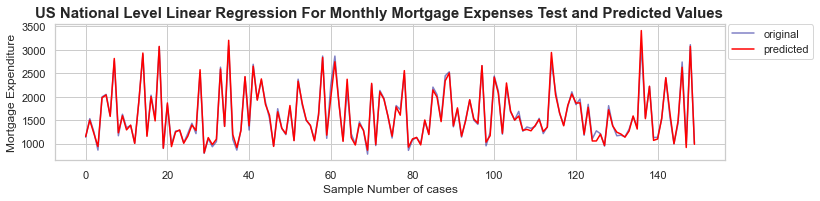

In [183]:
################################################################################################################################
# plot the graph of true and predicted values
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(12,2.5))
ax = range(len(ytest[0:150]))
plt.plot(ax, ytest[0:150], color='darkblue',label="original",alpha=.5)
plt.plot(ax, ypred[0:150], color='red', label="predicted")
plt.suptitle("US National Level Linear Regression For Monthly Mortgage Expenses Test and Predicted Values",\
             fontweight='bold',fontsize=15)
plt.xlabel('Sample Number of cases')
plt.ylabel('Mortgage Expenditure')
plt.legend(bbox_to_anchor=(0.64, .54, 0.5, 0.5))
plt.show()


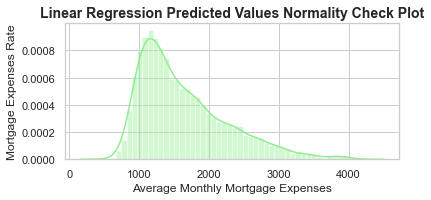

In [185]:
################################################################################################################################
# Plot the distribution of the predicted values for Normality check
################################################################################################################################
plt.figure(figsize=(6,2.5))
sns.distplot(ypred,color='lightgreen')
plt.title('Linear Regression Predicted Values Normality Check Plot',fontweight='bold',fontsize=14)
plt.xlabel('Average Monthly Mortgage Expenses')
plt.ylabel('Mortgage Expenses Rate')
plt.show()

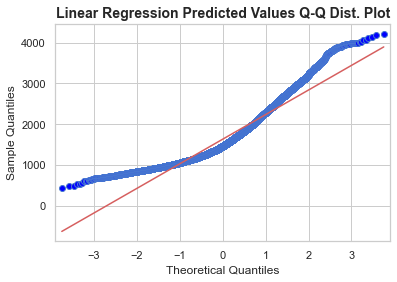

In [196]:
################################################################################################################################
# QQ Plot Normality Check of the Predicted Monthly Mortgage expenses
################################################################################################################################
from statsmodels.graphics.gofplots import qqplot

qqplot(ypred, line='r',fit=False)
plt.title('Linear Regression Predicted Values Q-Q Dist. Plot',fontweight='bold',fontsize=14)
plt.show()

In [197]:
################################################################################################################################
#Shapiro-Wilk Normality test of the Predicted Monthly Mortgage expenses
################################################################################################################################

from scipy.stats import shapiro
# normality test
stat, p = shapiro(ypred)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Predicted values looks Gaussian (fail to reject H0)')
else:
	print('Predicted does not look Gaussian (reject H0)')

Statistics=0.915, p=0.000
Predicted does not look Gaussian (reject H0)


In [198]:
printmd('XGBoost Regression Model')

## <span style="color:blue">XGBoost Regression Model</span>

In [199]:
################################################################################################################################
# import the required modules
################################################################################################################################
from xgboost import XGBRegressor, plot_importance

In [200]:
################################################################################################################################
# instantiate the xgboost regressor
################################################################################################################################

XGBR = XGBRegressor()


In [201]:
################################################################################################################################
# set the parameters for xgboost regressor as required
################################################################################################################################

XGBR.validate_parameters = True
XGBR.n_estimators =200
XGBR.feature_selector = 'greedy'
XGBR.objective='reg:squarederror'
XGBR.reg_lambda = 10
XGBR.eval_metric = 'rmse'
XGBR.verbosity = 1
XGBR.eta =0.303


In [202]:
################################################################################################################################
# fit the XGBoost model using train x and y variables 
################################################################################################################################

XGBmodel = XGBR.fit(xtrainPCA,ytrain)


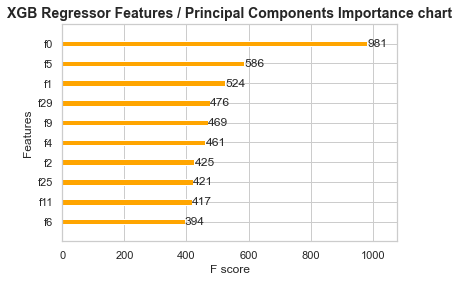

In [207]:
################################################################################################################################
#  plot the feature importance chart from XGBRegressor
################################################################################################################################

plot_importance(XGBR, max_num_features=10,show_values=True,height=.28,color='orange',             
                importance_type='weight')
plt.title('XGB Regressor Features / Principal Components Importance chart',fontweight='bold',fontsize=14)
plt.show()


In [208]:
################################################################################################################################
# print the Rsquared accuracy score while training 
################################################################################################################################

score = XGBR.score(xtrainPCA,ytrain)  
print("XGBoost Training score: %.2f" % score)


XGBoost Training score: 0.99


In [209]:
################################################################################################################################
# print the Rsquared accuracy score while testing 
################################################################################################################################

score = XGBR.score(xtestPCA,ytest)  
print("XGBoost Testing score: %.2f" % score)


XGBoost Testing score: 0.96


In [210]:
################################################################################################################################
# pridict on the split test dataset to calculate different error values
################################################################################################################################

y_Pred = XGBR.predict(xtestPCA)


In [211]:
################################################################################################################################
# pysically compare the true and predicted first 10 values
################################################################################################################################

pd.DataFrame({'Actual values ': ytest, 'Predicted values ': y_Pred}).head(10)


,Actual values,Predicted values
UID,,
255504,1139.24548,1203.589844
252676,1533.25988,1588.771851
276314,1254.54462,1341.311890
248614,862.65763,1094.192261
286865,1996.41425,2083.407227
238666,2050.76604,2093.834473
240174,1598.17502,1626.534912
266241,2767.92928,2922.221924
224873,1168.36298,1361.169189


In [212]:
################################################################################################################################
# calculate the mean squared and root mean squared error values
################################################################################################################################

print('XGBoost Regressor R2_Squared value is     : ', np.round(r2_score(ytest,y_Pred)*100,2))
print('XGBoost Regressor Mean Absolute Error     : ', np.round(mean_absolute_error(ytest,y_Pred),2))
print('XGBoost Regressor Mean Squared Error      : ', np.round(mean_squared_error(ytest,y_Pred),2))
print('XGBoost Regressor Root Mean Squared Error : ', np.round(math.sqrt(mean_squared_error(ytest,y_Pred)),2))


XGBoost Regressor R2_Squared value is     :  96.17
XGBoost Regressor Mean Absolute Error     :  89.14
XGBoost Regressor Mean Squared Error      :  15430.78
XGBoost Regressor Root Mean Squared Error :  124.22


In [213]:
printmd('XGBoost Regression Model got R Squared value of 96.17 ')

## <span style="color:blue">XGBoost Regression Model got R Squared value of 96.17 </span>

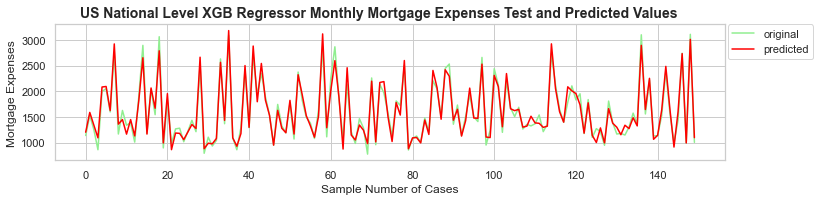

In [216]:
################################################################################################################################
# plot the graph of true and predicted values
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(12,2.5))
ax = range(len(ytest[0:150]))
plt.plot(ax, ytest[0:150], color='lightgreen',label="original")
plt.plot(ax, y_Pred[0:150],color='red', label="predicted")
plt.suptitle("US National Level XGB Regressor Monthly Mortgage Expenses Test and Predicted Values",\
             fontweight='bold',fontsize=14)
plt.xlabel('Sample Number of Cases')
plt.ylabel('Mortgage Expenses')
plt.legend(bbox_to_anchor=(0.64, .54, 0.5, 0.5))
plt.show()


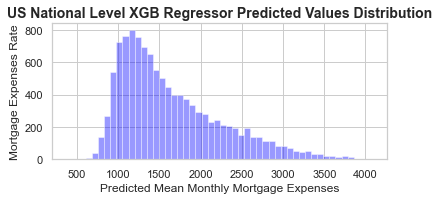

In [219]:
################################################################################################################################
# plot the predicted values distribution
################################################################################################################################
plt.figure(figsize=(6,2.5))
sns.distplot(y_Pred,color='blue',kde=False)
plt.title('US National Level XGB Regressor Predicted Values Distribution',fontweight='bold',fontsize=14)
plt.xlabel('Predicted Mean Monthly Mortgage Expenses')
plt.ylabel('Mortgage Expenses Rate')
plt.show()

In [220]:
printmd('Deep Neural Network Model')

## <span style="color:blue">Deep Neural Network Model</span>

In [221]:
################################################################################################################################
# import the libraries for deep learning model building
################################################################################################################################
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model 
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import ModelCheckpoint 
from tensorflow.keras.layers import Dropout, Input
from tensorflow.keras.layers import Flatten, Dense, BatchNormalization 
import tqdm 
import tensorflow_addons as tfa
tqdm_callback = tfa.callbacks.TQDMProgressBar()
import time


In [222]:
################################################################################################################################
# build the deep learnig model and compile for health care data analysis 
################################################################################################################################
model = Sequential()
model.add(Input(shape=(37,)))

model.add(Dense(1024, activation=tf.nn.relu, kernel_regularizer = tf.keras.regularizers.l2(0.000001)))  
model.add(BatchNormalization())
model.add(Dropout(.4))

model.add(Dense(256, activation=tf.nn.relu, kernel_regularizer = tf.keras.regularizers.l2(0.000001))) 
model.add(Dropout(.4))
model.add(BatchNormalization())

model.add(Dense(32, activation=tf.nn.relu, kernel_regularizer = tf.keras.regularizers.l1(0.000001))) 
model.add(Dropout(.4))
model.add(BatchNormalization())

model.add(Flatten())
model.add(Dense(1, activation=tf.nn.relu))

opt = Adam(lr=0.02,beta_1=0.5)  

model.compile(loss='mse', optimizer=opt, metrics=['mse'])

In [223]:
################################################################################################################################
# define the path for the trained model from local directory and also define the checkpoints on val_loss
################################################################################################################################
FILEPATH="./Weights/weights_RealEstate_Predictor_Dense1024.hdf5"


checkpoint = ModelCheckpoint(FILEPATH, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callback_list = [tqdm_callback, checkpoint]

In [240]:
################################################################################################################################
# load the trained model
################################################################################################################################
model = load_model(FILEPATH)
opt = Adam(lr=0.000002,beta_1=0.9)

#0.00002 is the really really good/right learning rate for many projects

model.compile(loss='mse', optimizer=opt, metrics=[ 'mse'])

################################################################################################################################
# print the summary of the loaded module
################################################################################################################################
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 1024)              38912     
_________________________________________________________________
batch_normalization_6 (Batch (None, 1024)              4096      
_________________________________________________________________
dropout_6 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 256)               262400    
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)               0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 256)               1024      
_________________________________________________________________
dense_10 (Dense)             (None, 32)               

In [239]:
################################################################################################################################
# fit the built model and run it for 1500 epochs
################################################################################################################################
history = model.fit(xtrainPCA, ytrain, validation_data=(xtestPCA, ytest), callbacks=callback_list,    
                    batch_size=2600, epochs=5, verbose=0)    

Training:   0%|                                                                                 0/5 ETA: ?s,  …

Epoch 1/5


0/11                                                                                                         E…


Epoch 00001: val_loss did not improve from 3744.16211
Epoch 2/5


0/11                                                                                                         E…


Epoch 00002: val_loss did not improve from 3744.16211
Epoch 3/5


0/11                                                                                                         E…


Epoch 00003: val_loss did not improve from 3744.16211
Epoch 4/5


0/11                                                                                                         E…


Epoch 00004: val_loss did not improve from 3744.16211
Epoch 5/5


0/11                                                                                                         E…


Epoch 00005: val_loss did not improve from 3744.16211


In [241]:
################################################################################################################################
# extract the variables for accuracy and loss reporting
################################################################################################################################
train_loss, train_acc = model.evaluate(xtrainPCA, ytrain, verbose=0,callbacks=[tqdm_callback])
test_loss, test_acc = model.evaluate(xtestPCA, ytest, verbose=0,callbacks=[tqdm_callback])
print('Train Accu: %.3f, Test Accu: %.3f' % (train_acc, test_acc))
print('Train Loss: %.3f, Test Loss: %.3f' % (train_loss, test_loss))



0/835                                                                                              ETA: ?s - E…

0/358                                                                                              ETA: ?s - E…

Train Accu: 2676.716, Test Accu: 3723.452
Train Loss: 2678.035, Test Loss: 3724.771


In [243]:
################################################################################################################################
# pridict on the split test dataset to calculate different error values
################################################################################################################################

y_Pred = model.predict(xtestPCA)

In [244]:
################################################################################################################################
# calcualate the r squared values for split test dataset
################################################################################################################################

R_squared = r2_score(ytest, y_Pred)
print("Deep Neural Network R-Squared: ", np.round(R_squared, 8))


Deep Neural Network R-Squared:  0.99074853


In [245]:
 y_Pred.shape,ytest.shape

((11432, 1), (11432,))

In [246]:
y_Pred= y_Pred.reshape(11432,)

In [247]:
################################################################################################################################
# pysically compare the true and predicted first 10 values
################################################################################################################################

pd.DataFrame({'Actual values ': ytest, 'Predicted values ': y_Pred}).head(10)


,Actual values,Predicted values
UID,,
255504,1139.24548,1140.379761
252676,1533.25988,1483.162354
276314,1254.54462,1224.515991
248614,862.65763,965.280823
286865,1996.41425,2026.218262
238666,2050.76604,2060.527832
240174,1598.17502,1570.657959
266241,2767.92928,2853.176270
224873,1168.36298,1257.117676


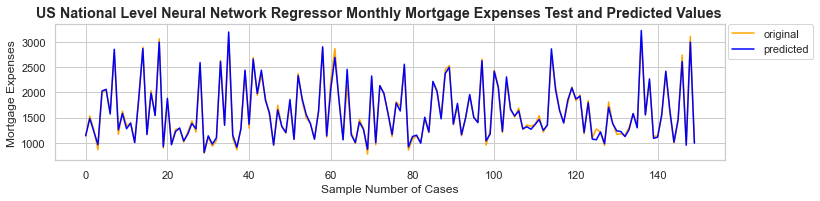

In [249]:
################################################################################################################################
# plot the graph of true and predicted values
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(12,2.5))
ax = range(len(ytest[0:150]))
plt.plot(ax, ytest[0:150], color='orange',label="original")
plt.plot(ax, y_Pred[0:150], color='blue',label="predicted")
plt.suptitle("US National Level Neural Network Regressor Monthly Mortgage Expenses Test and Predicted Values",fontweight='bold')
plt.xlabel('Sample Number of Cases')
plt.ylabel('Mortgage Expenses')
plt.legend(bbox_to_anchor=(0.64, .54, 0.5, 0.5))
plt.show()

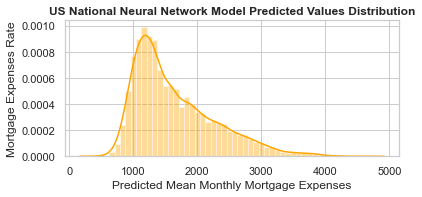

In [251]:
################################################################################################################################
# plot the predicted values distribution
################################################################################################################################
plt.figure(figsize=(6,2.5))
sns.distplot(y_Pred,color='orange',kde=True)
plt.title('US National Neural Network Model Predicted Values Distribution',fontweight='bold')
plt.xlabel('Predicted Mean Monthly Mortgage Expenses')
plt.ylabel('Mortgage Expenses Rate')
plt.show()

In [252]:
################################################################################################################################
# calculate the mean squared and root mean squared error values
################################################################################################################################

print('Deep Neural Network R2_Squared value is     : ', np.round(r2_score(ytest,y_Pred)*100,2))
print('Deep Neural Network Mean Absolute Error     : ', np.round(mean_absolute_error(ytest,y_Pred),2))
print('Deep Neural Network Mean Squared Error      : ', np.round(mean_squared_error(ytest,y_Pred),2))
print('Deep Neural Network Root Mean Squared Error : ', np.round(math.sqrt(mean_squared_error(ytest,y_Pred)),2))


Deep Neural Network R2_Squared value is     :  99.07
Deep Neural Network Mean Absolute Error     :  42.18
Deep Neural Network Mean Squared Error      :  3723.45
Deep Neural Network Root Mean Squared Error :  61.02


In [253]:
printmd('Deep Neural Network Model R Squared value is 99.07')

## <span style="color:blue">Deep Neural Network Model R Squared value is 99.07</span>

In [254]:
printmd('Predicted values are normally distributed by all 3 National level models; little skewed though..')
printmd('Ensured No Multi-collinearity among variables by performing Principle Component Analysis.')
printmd('Components have been choosen to capture 99% varaiance among the variables ')
printmd('3 National level models have R squared values of') 
printmd('Linear Regressor------------------- 98.68')
printmd('XGBoost Regressor--------------- 96.17')
printmd('Deep Neural Network------------- 99.07')

## <span style="color:blue">Predicted values are normally distributed by all 3 National level models; little skewed though..</span>

## <span style="color:blue">Ensured No Multi-collinearity among variables by performing Principle Component Analysis.</span>

## <span style="color:blue">Components have been choosen to capture 99% varaiance among the variables </span>

## <span style="color:blue">3 National level models have R squared values of</span>

## <span style="color:blue">Linear Regressor------------------- 98.68</span>

## <span style="color:blue">XGBoost Regressor--------------- 96.17</span>

## <span style="color:blue">Deep Neural Network------------- 99.07</span>

In [255]:
#------------------------------------------------------------------------------------------------------------------------

In [256]:
printmd("52 different Linear Regression Models for 52 different US States. ")

## <span style="color:blue">52 different Linear Regression Models for 52 different US States. </span>

## <span style="color:red">Alabama</span>

 
 
Linear Regression Model for the state of Alabama
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Alabama are  (407, 75) (407,) (200, 75) (200,)
Data shapes after  PCA for the state of         :  Alabama are  (407, 41) (200, 41)
 
Accuracy on train data for the state            :  Alabama  is  96.8
R squared value for the state                   :  Alabama  is  92.52
Root Mean Square Error value for the state      :  Alabama  is  83.62
 


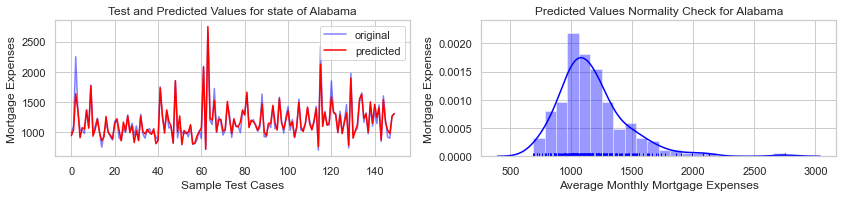

## <span style="color:red">Alaska</span>

 
 
Linear Regression Model for the state of Alaska
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Alaska are  (74, 75) (74,) (29, 75) (29,)
Data shapes after  PCA for the state of         :  Alaska are  (74, 34) (29, 34)
 
Accuracy on train data for the state            :  Alaska  is  97.77
R squared value for the state                   :  Alaska  is  81.88
Root Mean Square Error value for the state      :  Alaska  is  201.28
 


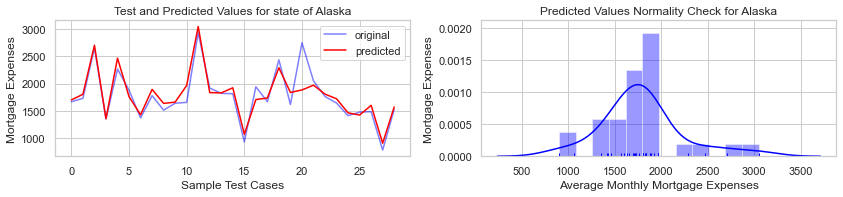

## <span style="color:red">Arizona</span>

 
 
Linear Regression Model for the state of Arizona
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Arizona are  (527, 75) (527,) (252, 75) (252,)
Data shapes after  PCA for the state of         :  Arizona are  (527, 41) (252, 41)
 
Accuracy on train data for the state            :  Arizona  is  95.98
R squared value for the state                   :  Arizona  is  93.03
Root Mean Square Error value for the state      :  Arizona  is  98.93
 


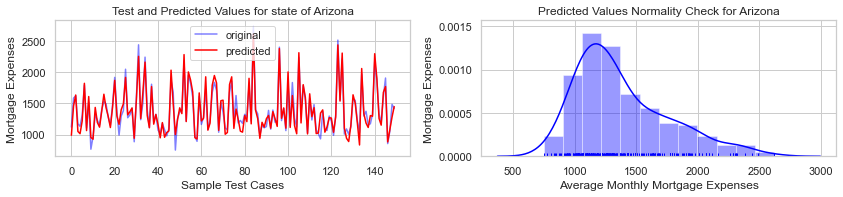

## <span style="color:red">Arkansas</span>

 
 
Linear Regression Model for the state of Arkansas
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Arkansas are  (264, 75) (264,) (92, 75) (92,)
Data shapes after  PCA for the state of         :  Arkansas are  (264, 39) (92, 39)
 
Accuracy on train data for the state            :  Arkansas  is  96.29
R squared value for the state                   :  Arkansas  is  94.05
Root Mean Square Error value for the state      :  Arkansas  is  65.13
 


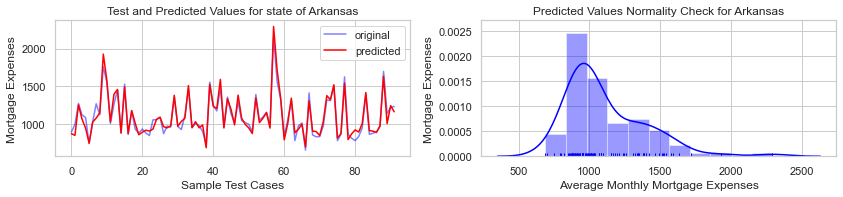

## <span style="color:red">California</span>

 
 
Linear Regression Model for the state of California
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  California are  (2854, 75) (2854,) (1238, 75) (1238,)
Data shapes after  PCA for the state of         :  California are  (2854, 39) (1238, 39)
 
Accuracy on train data for the state            :  California  is  98.01
R squared value for the state                   :  California  is  97.97
Root Mean Square Error value for the state      :  California  is  90.09
 


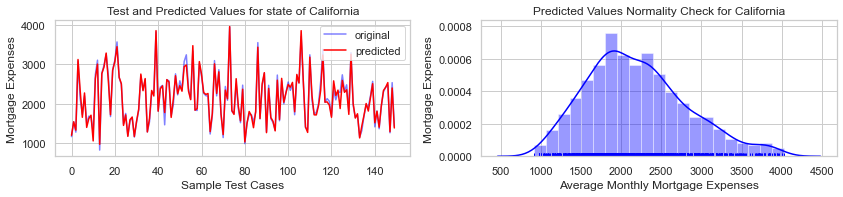

## <span style="color:red">Colorado</span>

 
 
Linear Regression Model for the state of Colorado
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Colorado are  (465, 75) (465,) (181, 75) (181,)
Data shapes after  PCA for the state of         :  Colorado are  (465, 41) (181, 41)
 
Accuracy on train data for the state            :  Colorado  is  95.31
R squared value for the state                   :  Colorado  is  94.75
Root Mean Square Error value for the state      :  Colorado  is  104.12
 


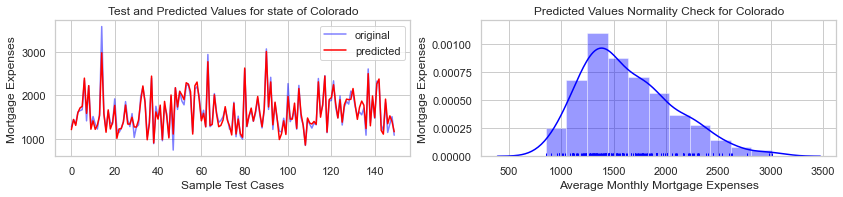

## <span style="color:red">Connecticut</span>

 
 
Linear Regression Model for the state of Connecticut
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Connecticut are  (321, 75) (321,) (115, 75) (115,)
Data shapes after  PCA for the state of         :  Connecticut are  (321, 40) (115, 40)
 
Accuracy on train data for the state            :  Connecticut  is  97.56
R squared value for the state                   :  Connecticut  is  95.39
Root Mean Square Error value for the state      :  Connecticut  is  122.26
 


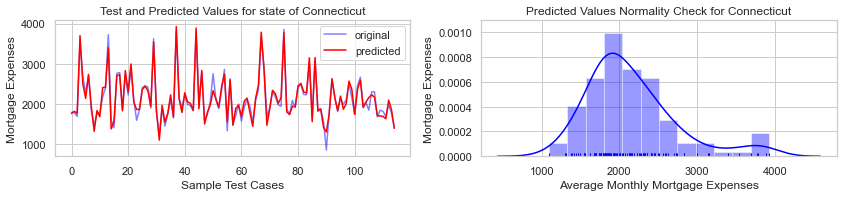

## <span style="color:red">Delaware</span>

 
 
Linear Regression Model for the state of Delaware
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Delaware are  (71, 75) (71,) (37, 75) (37,)
Data shapes after  PCA for the state of         :  Delaware are  (71, 32) (37, 32)
 
Accuracy on train data for the state            :  Delaware  is  97.78
R squared value for the state                   :  Delaware  is  92.42
Root Mean Square Error value for the state      :  Delaware  is  88.0
 


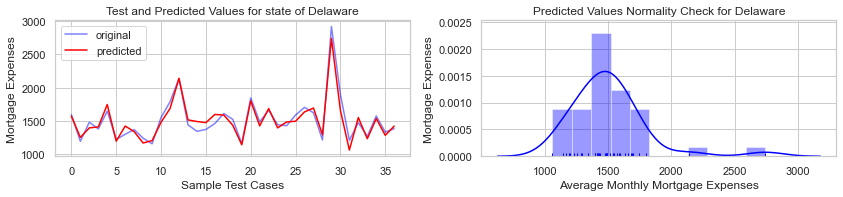

## <span style="color:red">District of Columbia</span>

 
 
Linear Regression Model for the state of District of Columbia
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  District of Columbia are  (65, 75) (65,) (31, 75) (31,)
Data shapes after  PCA for the state of         :  District of Columbia are  (65, 32) (31, 32)
 
Accuracy on train data for the state            :  District of Columbia  is  98.29
R squared value for the state                   :  District of Columbia  is  93.13
Root Mean Square Error value for the state      :  District of Columbia  is  180.53
 


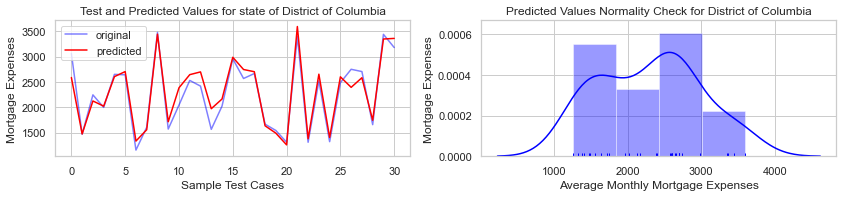

## <span style="color:red">Florida</span>

 
 
Linear Regression Model for the state of Florida
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Florida are  (1572, 75) (1572,) (668, 75) (668,)
Data shapes after  PCA for the state of         :  Florida are  (1572, 40) (668, 40)
 
Accuracy on train data for the state            :  Florida  is  98.23
R squared value for the state                   :  Florida  is  97.9
Root Mean Square Error value for the state      :  Florida  is  80.67
 


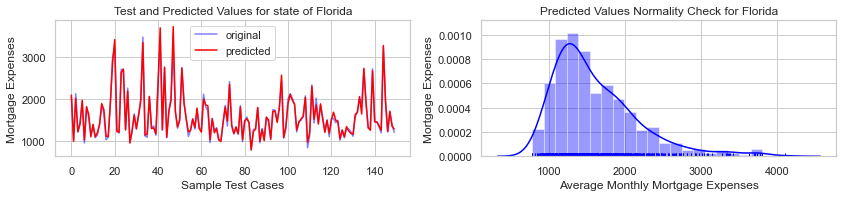

## <span style="color:red">Georgia</span>

 
 
Linear Regression Model for the state of Georgia
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Georgia are  (760, 75) (760,) (293, 75) (293,)
Data shapes after  PCA for the state of         :  Georgia are  (760, 41) (293, 41)
 
Accuracy on train data for the state            :  Georgia  is  95.06
R squared value for the state                   :  Georgia  is  91.09
Root Mean Square Error value for the state      :  Georgia  is  130.0
 


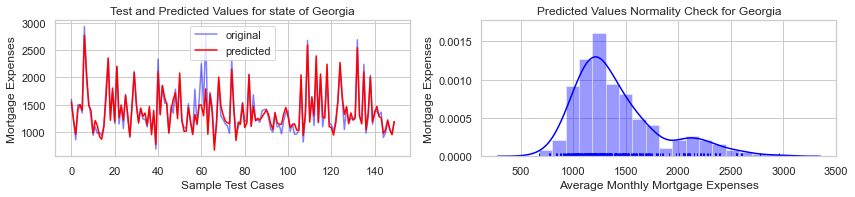

## <span style="color:red">Hawaii</span>

 
 
Linear Regression Model for the state of Hawaii
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Hawaii are  (118, 75) (118,) (40, 75) (40,)
Data shapes after  PCA for the state of         :  Hawaii are  (118, 37) (40, 37)
 
Accuracy on train data for the state            :  Hawaii  is  97.59
R squared value for the state                   :  Hawaii  is  83.66
Root Mean Square Error value for the state      :  Hawaii  is  144.27
 


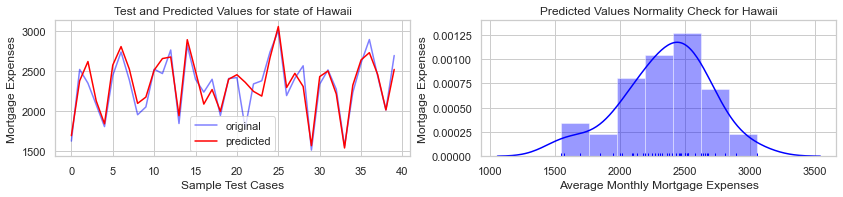

## <span style="color:red">Idaho</span>

 
 
Linear Regression Model for the state of Idaho
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Idaho are  (101, 75) (101,) (47, 75) (47,)
Data shapes after  PCA for the state of         :  Idaho are  (101, 36) (47, 36)
 
Accuracy on train data for the state            :  Idaho  is  96.6
R squared value for the state                   :  Idaho  is  86.75
Root Mean Square Error value for the state      :  Idaho  is  90.0
 


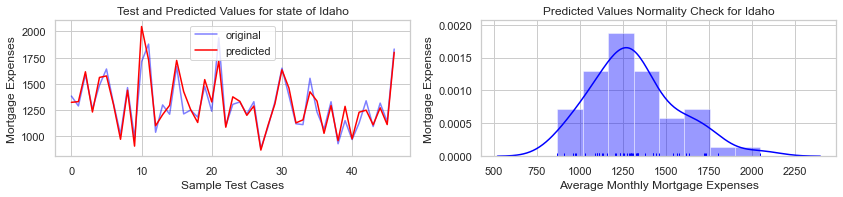

## <span style="color:red">Illinois</span>

 
 
Linear Regression Model for the state of Illinois
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Illinois are  (1099, 75) (1099,) (475, 75) (475,)
Data shapes after  PCA for the state of         :  Illinois are  (1099, 40) (475, 40)
 
Accuracy on train data for the state            :  Illinois  is  98.42
R squared value for the state                   :  Illinois  is  98.07
Root Mean Square Error value for the state      :  Illinois  is  78.63
 


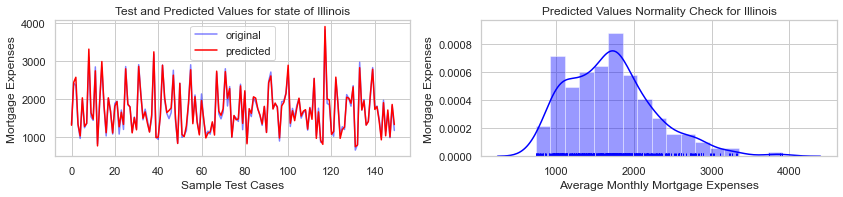

## <span style="color:red">Indiana</span>

 
 
Linear Regression Model for the state of Indiana
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Indiana are  (568, 75) (568,) (226, 75) (226,)
Data shapes after  PCA for the state of         :  Indiana are  (568, 41) (226, 41)
 
Accuracy on train data for the state            :  Indiana  is  98.33
R squared value for the state                   :  Indiana  is  97.98
Root Mean Square Error value for the state      :  Indiana  is  38.35
 


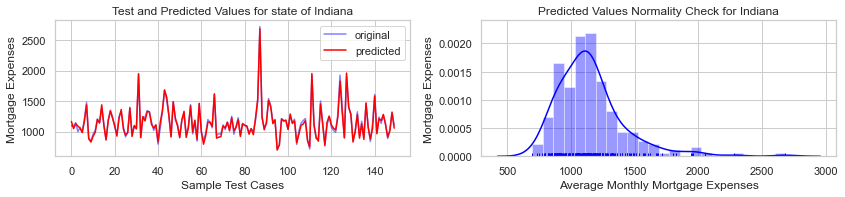

## <span style="color:red">Iowa</span>

 
 
Linear Regression Model for the state of Iowa
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Iowa are  (287, 75) (287,) (127, 75) (127,)
Data shapes after  PCA for the state of         :  Iowa are  (287, 39) (127, 39)
 
Accuracy on train data for the state            :  Iowa  is  90.27
R squared value for the state                   :  Iowa  is  85.77
Root Mean Square Error value for the state      :  Iowa  is  92.34
 


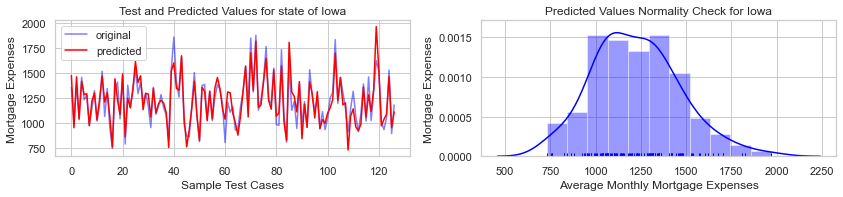

## <span style="color:red">Kansas</span>

 
 
Linear Regression Model for the state of Kansas
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Kansas are  (295, 75) (295,) (132, 75) (132,)
Data shapes after  PCA for the state of         :  Kansas are  (295, 39) (132, 39)
 
Accuracy on train data for the state            :  Kansas  is  98.83
R squared value for the state                   :  Kansas  is  98.5
Root Mean Square Error value for the state      :  Kansas  is  50.73
 


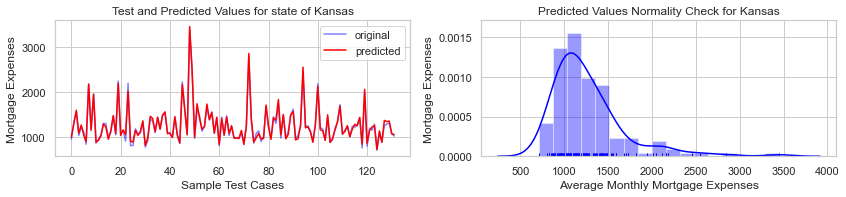

## <span style="color:red">Kentucky</span>

 
 
Linear Regression Model for the state of Kentucky
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Kentucky are  (392, 75) (392,) (171, 75) (171,)
Data shapes after  PCA for the state of         :  Kentucky are  (392, 40) (171, 40)
 
Accuracy on train data for the state            :  Kentucky  is  96.91
R squared value for the state                   :  Kentucky  is  93.64
Root Mean Square Error value for the state      :  Kentucky  is  74.58
 


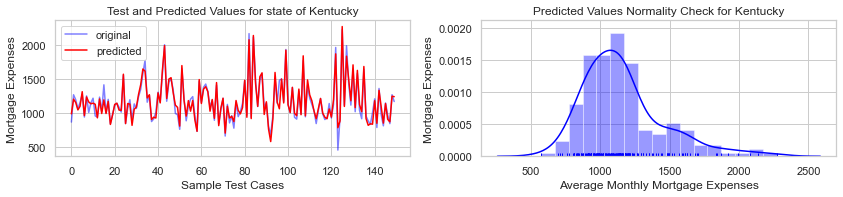

## <span style="color:red">Louisiana</span>

 
 
Linear Regression Model for the state of Louisiana
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Louisiana are  (423, 75) (423,) (175, 75) (175,)
Data shapes after  PCA for the state of         :  Louisiana are  (423, 40) (175, 40)
 
Accuracy on train data for the state            :  Louisiana  is  96.49
R squared value for the state                   :  Louisiana  is  91.98
Root Mean Square Error value for the state      :  Louisiana  is  115.77
 


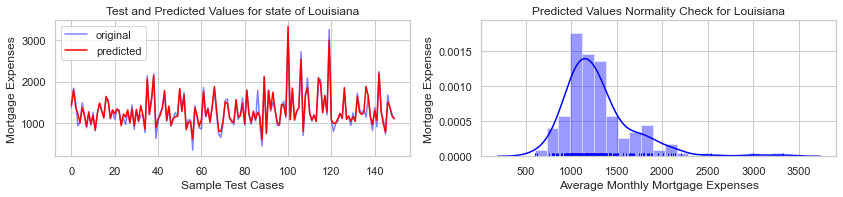

## <span style="color:red">Maine</span>

 
 
Linear Regression Model for the state of Maine
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Maine are  (130, 75) (130,) (60, 75) (60,)
Data shapes after  PCA for the state of         :  Maine are  (130, 38) (60, 38)
 
Accuracy on train data for the state            :  Maine  is  97.69
R squared value for the state                   :  Maine  is  95.01
Root Mean Square Error value for the state      :  Maine  is  81.85
 


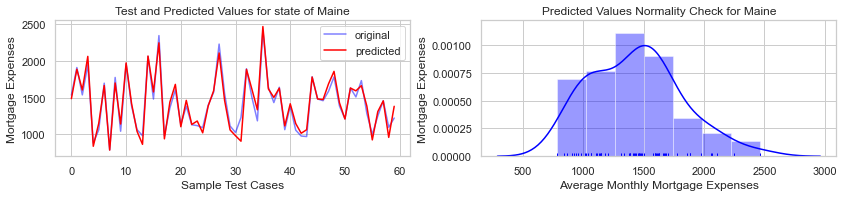

## <span style="color:red">Maryland</span>

 
 
Linear Regression Model for the state of Maryland
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Maryland are  (515, 75) (515,) (223, 75) (223,)
Data shapes after  PCA for the state of         :  Maryland are  (515, 42) (223, 42)
 
Accuracy on train data for the state            :  Maryland  is  94.46
R squared value for the state                   :  Maryland  is  95.3
Root Mean Square Error value for the state      :  Maryland  is  122.09
 


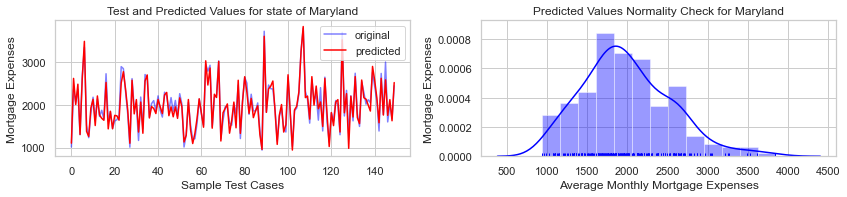

## <span style="color:red">Massachusetts</span>

 
 
Linear Regression Model for the state of Massachusetts
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Massachusetts are  (541, 75) (541,) (222, 75) (222,)
Data shapes after  PCA for the state of         :  Massachusetts are  (541, 42) (222, 42)
 
Accuracy on train data for the state            :  Massachusetts  is  97.47
R squared value for the state                   :  Massachusetts  is  95.7
Root Mean Square Error value for the state      :  Massachusetts  is  97.56
 


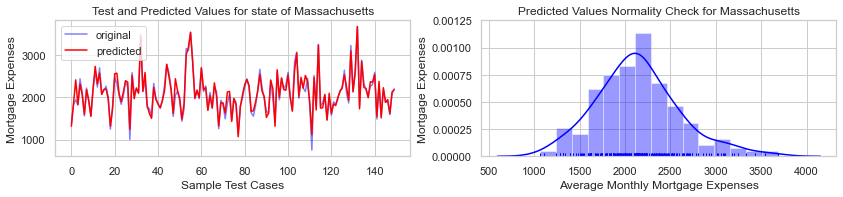

## <span style="color:red">Michigan</span>

 
 
Linear Regression Model for the state of Michigan
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Michigan are  (1018, 75) (1018,) (414, 75) (414,)
Data shapes after  PCA for the state of         :  Michigan are  (1018, 41) (414, 41)
 
Accuracy on train data for the state            :  Michigan  is  94.91
R squared value for the state                   :  Michigan  is  94.07
Root Mean Square Error value for the state      :  Michigan  is  97.1
 


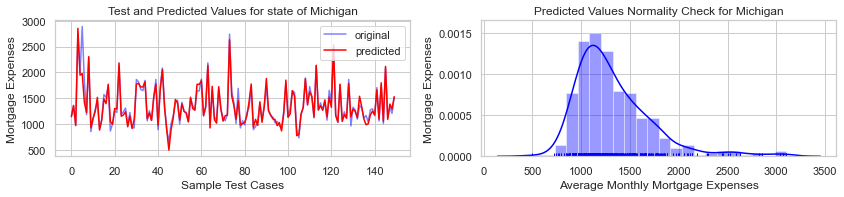

## <span style="color:red">Minnesota</span>

 
 
Linear Regression Model for the state of Minnesota
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Minnesota are  (496, 75) (496,) (197, 75) (197,)
Data shapes after  PCA for the state of         :  Minnesota are  (496, 39) (197, 39)
 
Accuracy on train data for the state            :  Minnesota  is  97.88
R squared value for the state                   :  Minnesota  is  96.98
Root Mean Square Error value for the state      :  Minnesota  is  63.28
 


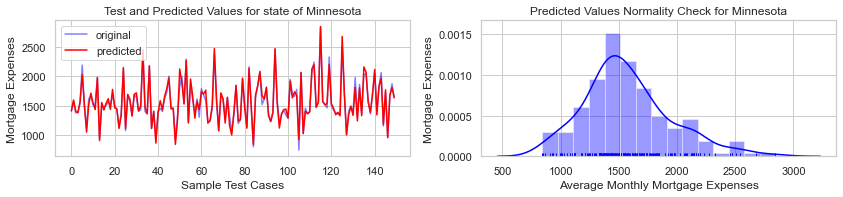

## <span style="color:red">Mississippi</span>

 
 
Linear Regression Model for the state of Mississippi
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Mississippi are  (242, 75) (242,) (105, 75) (105,)
Data shapes after  PCA for the state of         :  Mississippi are  (242, 40) (105, 40)
 
Accuracy on train data for the state            :  Mississippi  is  97.85
R squared value for the state                   :  Mississippi  is  96.38
Root Mean Square Error value for the state      :  Mississippi  is  53.01
 


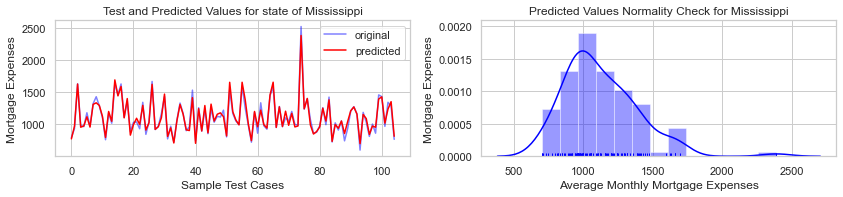

## <span style="color:red">Missouri</span>

 
 
Linear Regression Model for the state of Missouri
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Missouri are  (491, 75) (491,) (232, 75) (232,)
Data shapes after  PCA for the state of         :  Missouri are  (491, 41) (232, 41)
 
Accuracy on train data for the state            :  Missouri  is  88.95
R squared value for the state                   :  Missouri  is  93.46
Root Mean Square Error value for the state      :  Missouri  is  110.32
 


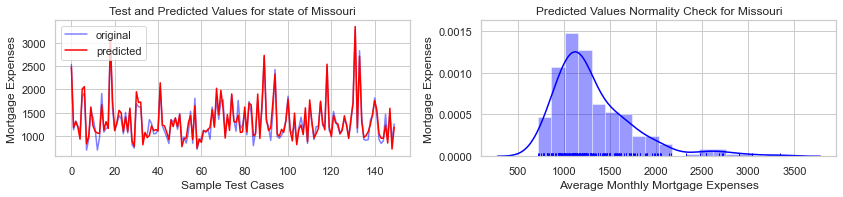

## <span style="color:red">Montana</span>

 
 
Linear Regression Model for the state of Montana
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Montana are  (117, 75) (117,) (40, 75) (40,)
Data shapes after  PCA for the state of         :  Montana are  (117, 37) (40, 37)
 
Accuracy on train data for the state            :  Montana  is  95.58
R squared value for the state                   :  Montana  is  82.57
Root Mean Square Error value for the state      :  Montana  is  107.59
 


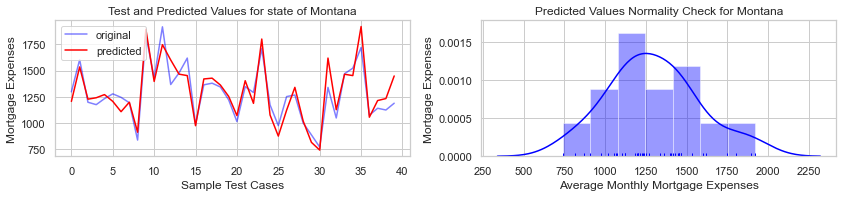

## <span style="color:red">Nebraska</span>

 
 
Linear Regression Model for the state of Nebraska
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Nebraska are  (185, 75) (185,) (84, 75) (84,)
Data shapes after  PCA for the state of         :  Nebraska are  (185, 38) (84, 38)
 
Accuracy on train data for the state            :  Nebraska  is  96.88
R squared value for the state                   :  Nebraska  is  93.65
Root Mean Square Error value for the state      :  Nebraska  is  115.73
 


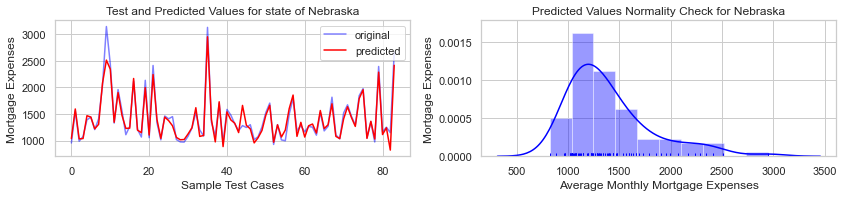

## <span style="color:red">Nevada</span>

 
 
Linear Regression Model for the state of Nevada
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Nevada are  (239, 75) (239,) (105, 75) (105,)
Data shapes after  PCA for the state of         :  Nevada are  (239, 41) (105, 41)
 
Accuracy on train data for the state            :  Nevada  is  96.59
R squared value for the state                   :  Nevada  is  94.55
Root Mean Square Error value for the state      :  Nevada  is  106.26
 


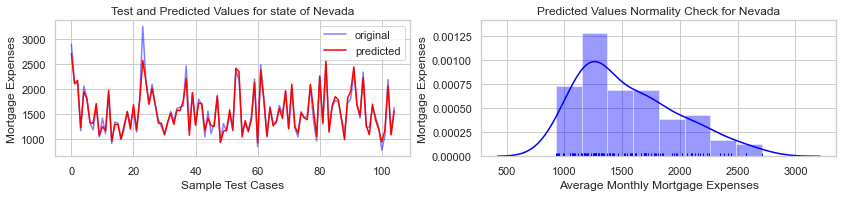

## <span style="color:red">New Hampshire</span>

 
 
Linear Regression Model for the state of New Hampshire
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  New Hampshire are  (111, 75) (111,) (45, 75) (45,)
Data shapes after  PCA for the state of         :  New Hampshire are  (111, 37) (45, 37)
 
Accuracy on train data for the state            :  New Hampshire  is  98.61
R squared value for the state                   :  New Hampshire  is  89.13
Root Mean Square Error value for the state      :  New Hampshire  is  91.53
 


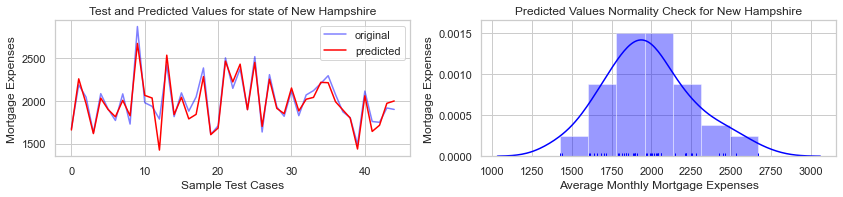

## <span style="color:red">New Jersey</span>

 
 
Linear Regression Model for the state of New Jersey
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  New Jersey are  (689, 75) (689,) (303, 75) (303,)
Data shapes after  PCA for the state of         :  New Jersey are  (689, 42) (303, 42)
 
Accuracy on train data for the state            :  New Jersey  is  97.3
R squared value for the state                   :  New Jersey  is  96.33
Root Mean Square Error value for the state      :  New Jersey  is  101.85
 


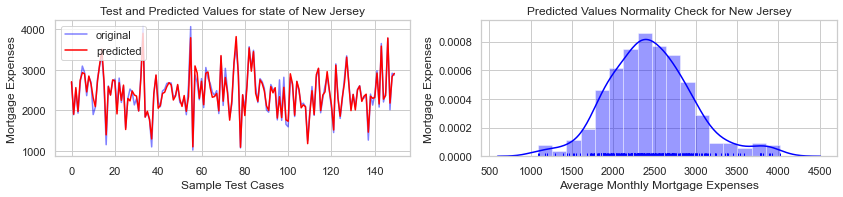

## <span style="color:red">New Mexico</span>

 
 
Linear Regression Model for the state of New Mexico
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  New Mexico are  (196, 75) (196,) (90, 75) (90,)
Data shapes after  PCA for the state of         :  New Mexico are  (196, 39) (90, 39)
 
Accuracy on train data for the state            :  New Mexico  is  98.68
R squared value for the state                   :  New Mexico  is  97.7
Root Mean Square Error value for the state      :  New Mexico  is  69.22
 


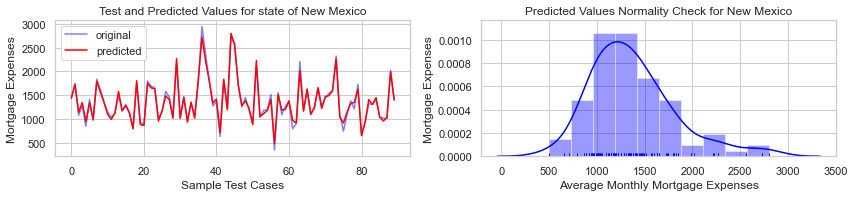

## <span style="color:red">New York</span>

 
 
Linear Regression Model for the state of New York
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  New York are  (1706, 75) (1706,) (728, 75) (728,)
Data shapes after  PCA for the state of         :  New York are  (1706, 42) (728, 42)
 
Accuracy on train data for the state            :  New York  is  97.26
R squared value for the state                   :  New York  is  96.56
Root Mean Square Error value for the state      :  New York  is  143.12
 


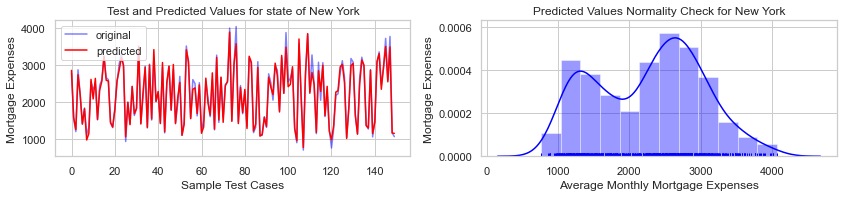

## <span style="color:red">North Carolina</span>

 
 
Linear Regression Model for the state of North Carolina
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  North Carolina are  (812, 75) (812,) (333, 75) (333,)
Data shapes after  PCA for the state of         :  North Carolina are  (812, 40) (333, 40)
 
Accuracy on train data for the state            :  North Carolina  is  98.22
R squared value for the state                   :  North Carolina  is  98.29
Root Mean Square Error value for the state      :  North Carolina  is  49.52
 


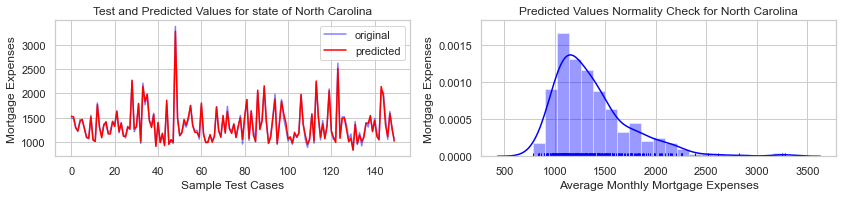

## <span style="color:red">North Dakota</span>

 
 
Linear Regression Model for the state of North Dakota
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  North Dakota are  (80, 75) (80,) (29, 75) (29,)
Data shapes after  PCA for the state of         :  North Dakota are  (80, 33) (29, 33)
 
Accuracy on train data for the state            :  North Dakota  is  97.14
R squared value for the state                   :  North Dakota  is  94.14
Root Mean Square Error value for the state      :  North Dakota  is  72.41
 


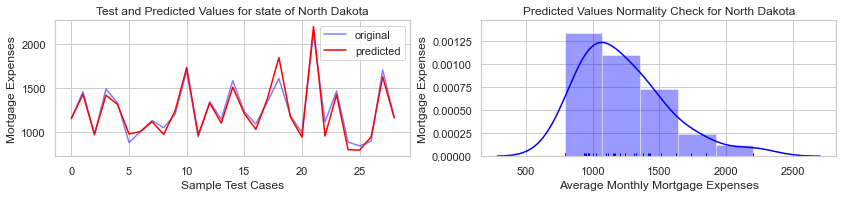

## <span style="color:red">Ohio</span>

 
 
Linear Regression Model for the state of Ohio
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Ohio are  (1079, 75) (1079,) (444, 75) (444,)
Data shapes after  PCA for the state of         :  Ohio are  (1079, 41) (444, 41)
 
Accuracy on train data for the state            :  Ohio  is  97.55
R squared value for the state                   :  Ohio  is  97.16
Root Mean Square Error value for the state      :  Ohio  is  61.76
 


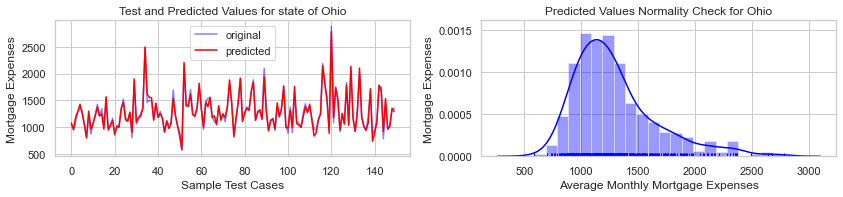

## <span style="color:red">Oklahoma</span>

 
 
Linear Regression Model for the state of Oklahoma
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Oklahoma are  (367, 75) (367,) (178, 75) (178,)
Data shapes after  PCA for the state of         :  Oklahoma are  (367, 39) (178, 39)
 
Accuracy on train data for the state            :  Oklahoma  is  96.41
R squared value for the state                   :  Oklahoma  is  94.94
Root Mean Square Error value for the state      :  Oklahoma  is  79.86
 


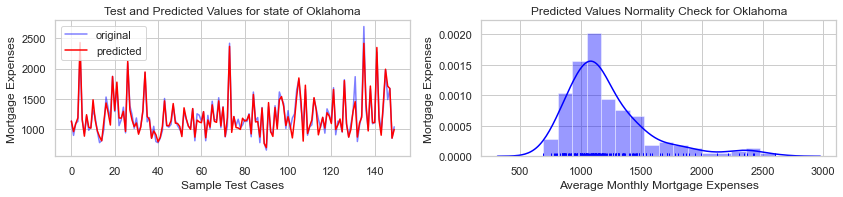

## <span style="color:red">Oregon</span>

 
 
Linear Regression Model for the state of Oregon
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Oregon are  (321, 75) (321,) (132, 75) (132,)
Data shapes after  PCA for the state of         :  Oregon are  (321, 39) (132, 39)
 
Accuracy on train data for the state            :  Oregon  is  96.66
R squared value for the state                   :  Oregon  is  95.09
Root Mean Square Error value for the state      :  Oregon  is  87.2
 


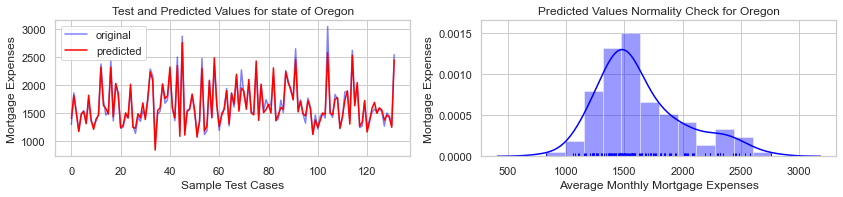

## <span style="color:red">Pennsylvania</span>

 
 
Linear Regression Model for the state of Pennsylvania
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Pennsylvania are  (1205, 75) (1205,) (498, 75) (498,)
Data shapes after  PCA for the state of         :  Pennsylvania are  (1205, 42) (498, 42)
 
Accuracy on train data for the state            :  Pennsylvania  is  96.62
R squared value for the state                   :  Pennsylvania  is  96.94
Root Mean Square Error value for the state      :  Pennsylvania  is  89.29
 


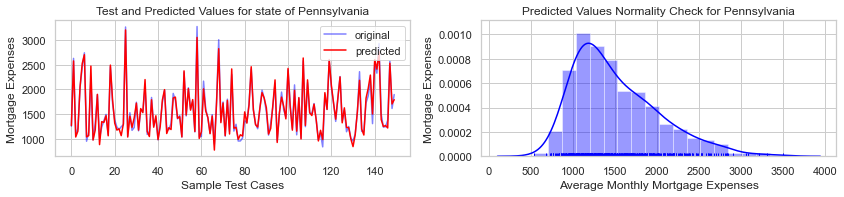

## <span style="color:red">Puerto Rico</span>

 
 
Linear Regression Model for the state of Puerto Rico
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Puerto Rico are  (301, 75) (301,) (160, 75) (160,)
Data shapes after  PCA for the state of         :  Puerto Rico are  (301, 41) (160, 41)
 
Accuracy on train data for the state            :  Puerto Rico  is  97.42
R squared value for the state                   :  Puerto Rico  is  96.01
Root Mean Square Error value for the state      :  Puerto Rico  is  60.64
 


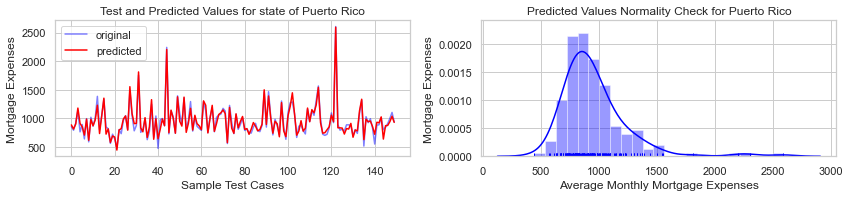

## <span style="color:red">Rhode Island</span>

 
 
Linear Regression Model for the state of Rhode Island
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Rhode Island are  (89, 75) (89,) (35, 75) (35,)
Data shapes after  PCA for the state of         :  Rhode Island are  (89, 36) (35, 36)
 
Accuracy on train data for the state            :  Rhode Island  is  96.94
R squared value for the state                   :  Rhode Island  is  94.22
Root Mean Square Error value for the state      :  Rhode Island  is  82.97
 


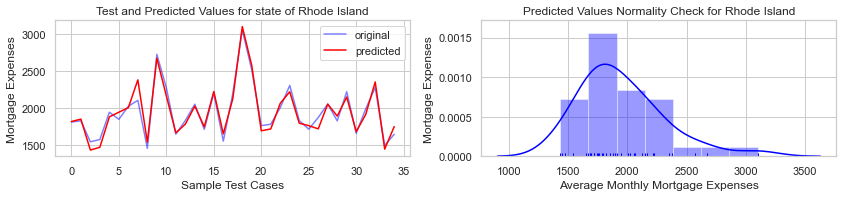

## <span style="color:red">South Carolina</span>

 
 
Linear Regression Model for the state of South Carolina
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  South Carolina are  (389, 75) (389,) (161, 75) (161,)
Data shapes after  PCA for the state of         :  South Carolina are  (389, 41) (161, 41)
 
Accuracy on train data for the state            :  South Carolina  is  95.91
R squared value for the state                   :  South Carolina  is  91.95
Root Mean Square Error value for the state      :  South Carolina  is  95.11
 


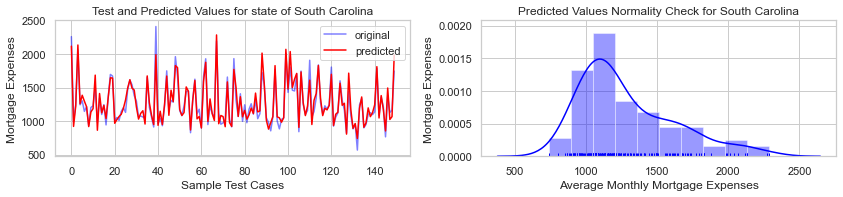

## <span style="color:red">South Dakota</span>

 
 
Linear Regression Model for the state of South Dakota
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  South Dakota are  (89, 75) (89,) (38, 75) (38,)
Data shapes after  PCA for the state of         :  South Dakota are  (89, 35) (38, 35)
 
Accuracy on train data for the state            :  South Dakota  is  96.56
R squared value for the state                   :  South Dakota  is  95.52
Root Mean Square Error value for the state      :  South Dakota  is  55.38
 


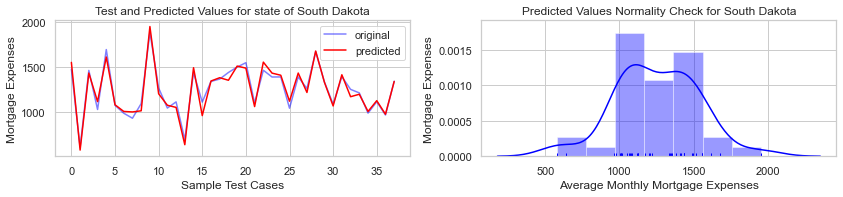

## <span style="color:red">Tennessee</span>

 
 
Linear Regression Model for the state of Tennessee
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Tennessee are  (511, 75) (511,) (253, 75) (253,)
Data shapes after  PCA for the state of         :  Tennessee are  (511, 40) (253, 40)
 
Accuracy on train data for the state            :  Tennessee  is  96.64
R squared value for the state                   :  Tennessee  is  95.57
Root Mean Square Error value for the state      :  Tennessee  is  72.85
 


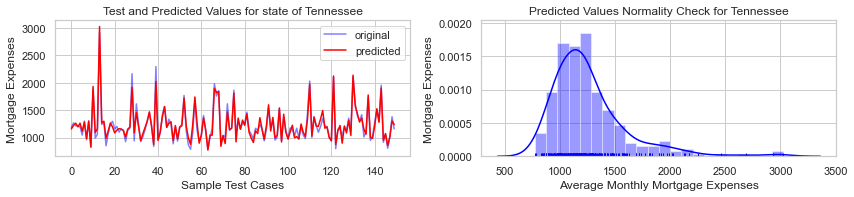

## <span style="color:red">Texas</span>

 
 
Linear Regression Model for the state of Texas
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Texas are  (1883, 75) (1883,) (793, 75) (793,)
Data shapes after  PCA for the state of         :  Texas are  (1883, 39) (793, 39)
 
Accuracy on train data for the state            :  Texas  is  95.21
R squared value for the state                   :  Texas  is  94.04
Root Mean Square Error value for the state      :  Texas  is  140.41
 


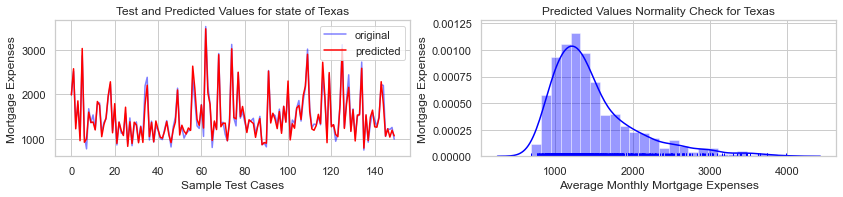

## <span style="color:red">Utah</span>

 
 
Linear Regression Model for the state of Utah
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Utah are  (225, 75) (225,) (96, 75) (96,)
Data shapes after  PCA for the state of         :  Utah are  (225, 40) (96, 40)
 
Accuracy on train data for the state            :  Utah  is  96.77
R squared value for the state                   :  Utah  is  94.18
Root Mean Square Error value for the state      :  Utah  is  107.07
 


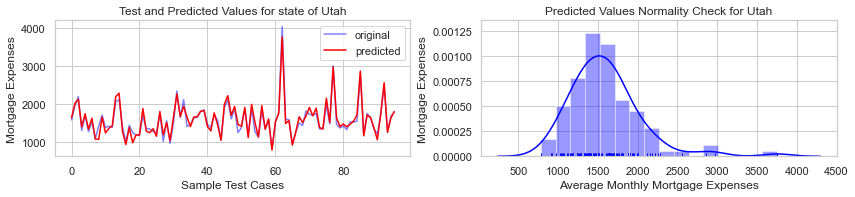

## <span style="color:red">Vermont</span>

 
 
Linear Regression Model for the state of Vermont
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Vermont are  (62, 75) (62,) (31, 75) (31,)
Data shapes after  PCA for the state of         :  Vermont are  (62, 32) (31, 32)
 
Accuracy on train data for the state            :  Vermont  is  97.9
R squared value for the state                   :  Vermont  is  70.31
Root Mean Square Error value for the state      :  Vermont  is  139.84
 


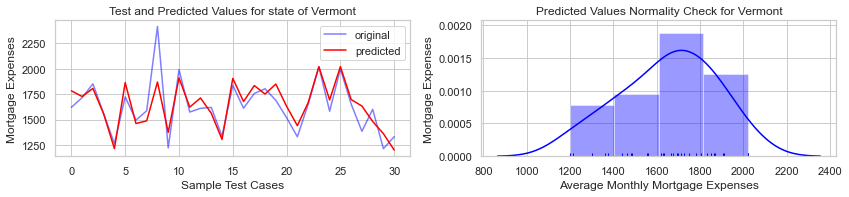

## <span style="color:red">Virginia</span>

 
 
Linear Regression Model for the state of Virginia
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Virginia are  (671, 75) (671,) (308, 75) (308,)
Data shapes after  PCA for the state of         :  Virginia are  (671, 41) (308, 41)
 
Accuracy on train data for the state            :  Virginia  is  98.53
R squared value for the state                   :  Virginia  is  98.04
Root Mean Square Error value for the state      :  Virginia  is  85.42
 


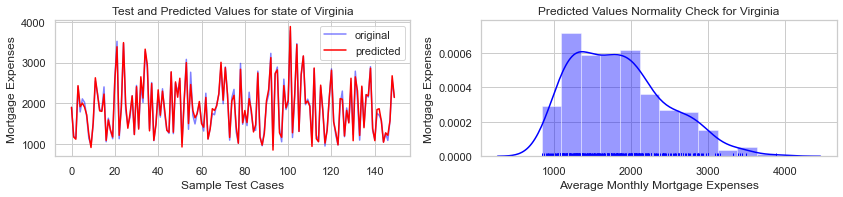

## <span style="color:red">Washington</span>

 
 
Linear Regression Model for the state of Washington
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Washington are  (538, 75) (538,) (262, 75) (262,)
Data shapes after  PCA for the state of         :  Washington are  (538, 41) (262, 41)
 
Accuracy on train data for the state            :  Washington  is  95.75
R squared value for the state                   :  Washington  is  94.69
Root Mean Square Error value for the state      :  Washington  is  111.32
 


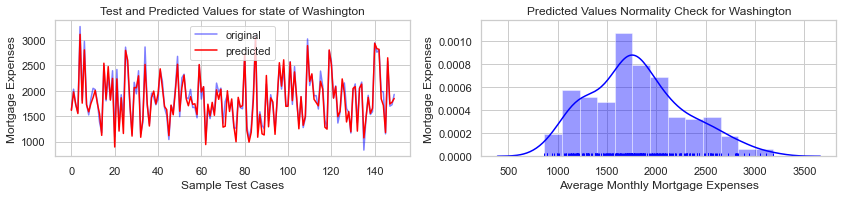

## <span style="color:red">West Virginia</span>

 
 
Linear Regression Model for the state of West Virginia
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  West Virginia are  (168, 75) (168,) (96, 75) (96,)
Data shapes after  PCA for the state of         :  West Virginia are  (168, 40) (96, 40)
 
Accuracy on train data for the state            :  West Virginia  is  98.17
R squared value for the state                   :  West Virginia  is  95.25
Root Mean Square Error value for the state      :  West Virginia  is  57.75
 


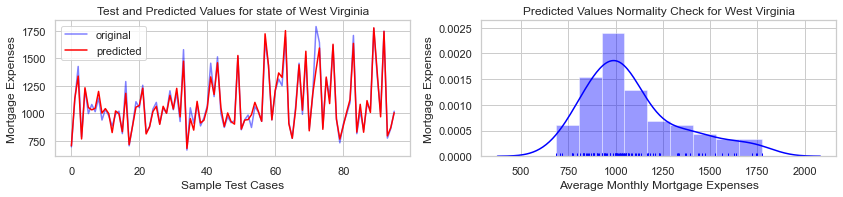

## <span style="color:red">Wisconsin</span>

 
 
Linear Regression Model for the state of Wisconsin
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Wisconsin are  (533, 75) (533,) (192, 75) (192,)
Data shapes after  PCA for the state of         :  Wisconsin are  (533, 39) (192, 39)
 
Accuracy on train data for the state            :  Wisconsin  is  95.93
R squared value for the state                   :  Wisconsin  is  90.79
Root Mean Square Error value for the state      :  Wisconsin  is  109.37
 


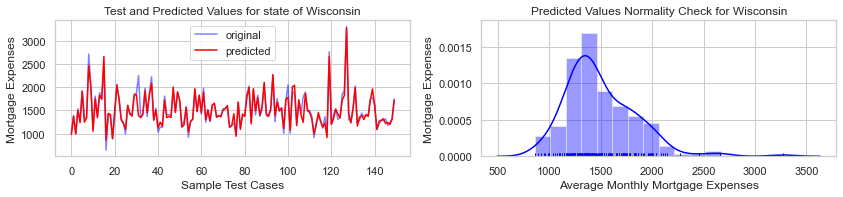

## <span style="color:red">Wyoming</span>

 
 
Linear Regression Model for the state of Wyoming
-------------------------------------------------------------------------------------------------------------------
Data shapes before PCA for the state of         :  Wyoming are  (57, 75) (57,) (16, 75) (16,)
Data shapes after  PCA for the state of         :  Wyoming are  (57, 31) (16, 31)
 
Accuracy on train data for the state            :  Wyoming  is  98.67
R squared value for the state                   :  Wyoming  is  82.71
Root Mean Square Error value for the state      :  Wyoming  is  97.87
 


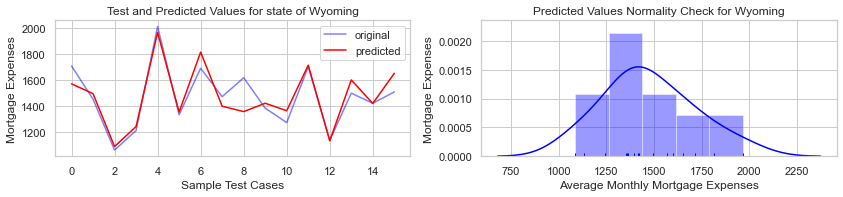

## <span style="color:red">State Level Linear Regression Models Average R Squared Value is 93.22</span>

In [258]:
def printmd(string):
    display(Markdown('## <span style="color:red">'+string+'</span>'))
RE_trainStates= RE_train.copy()
RE_testStates= RE_test.copy()
RE_trainStates.state       = le_state.inverse_transform(RE_trainStates.state)
RE_testStates.state       = le_state.inverse_transform(RE_testStates.state)
Avg_r_squared = 0
states_list= list(RE_trainStates.state.sort_values().unique())
for st in states_list: 
    printmd(st)
    print(' ')
    print(' ')
    print(('Linear Regression Model for the state of '+st))  #.center(120)
    print('-------------------------------------------------------------------------------------------------------------------') 
    #-------------------Data Preprocessing--------------------------------------------------------------------------------------
    RE_trainst = RE_trainStates[RE_trainStates.state==st]
    RE_trainst=RE_trainst.drop(['state','state_ab'],axis=1)
    Xtrain = RE_trainst.drop(['hc_mortgage_mean'],axis=1)
    ytrain = RE_trainst['hc_mortgage_mean']
    RE_testst = RE_testStates[RE_testStates.state==st]
    RE_testst=RE_testst.drop(['state','state_ab'],axis=1)
    Xtest = RE_testst.drop(['hc_mortgage_mean'],axis=1)
    ytest = RE_testst['hc_mortgage_mean']
    print('Data shapes before PCA for the state of         : ',st, 'are ', Xtrain.shape, ytrain.shape,Xtest.shape, ytest.shape)
    scaler = MinMaxScaler()
    scaler.fit(Xtrain)
    xtrain_scaled= scaler.transform(Xtrain)
    xtest_scaled= scaler.transform(Xtest)
    pca = PCA(n_components=.99)
    pca.fit(xtrain_scaled)
    xtestPCA = pca.transform(xtest_scaled)
    xtrainPCA = pca.transform(xtrain_scaled)
    print('Data shapes after  PCA for the state of         : ', st, 'are ', xtrainPCA.shape, xtestPCA.shape)
    #----------------Model Building and Metrics---------------------------------------------------------------------------------
    linearReg = LinearRegression()
    linearReg.fit(xtrainPCA,ytrain)
    print(' ')
    print('Accuracy on train data for the state            : ',st, ' is ', np.round((linearReg.score(xtrainPCA,ytrain)*100),2))
    #print(' ')
    ypred = linearReg.predict(xtestPCA)
    print('R squared value for the state                   : ', st, ' is ', np.round((r2_score(ytest,ypred)*100),2))
    #print(' ')
    print('Root Mean Square Error value for the state      : ', st, ' is ', np.round(math.sqrt(mean_squared_error(ytest,ypred)),2))
    Avg_r_squared = Avg_r_squared + r2_score(ytest,ypred)*100
    #--------------------------reporting----------------------------------------------------------------------------------------
    
    print(' ')
    plt.figure(figsize=(14,2.5))
    
    plt.subplot(1,2,1)
    sns.set(style='whitegrid', palette='muted', font_scale=1.0)
    ax = range(len(ytest[0:150]))
    plt.plot(ax, ytest[0:150], color='blue',label="original",alpha=.5)
    plt.plot(ax, ypred[0:150], color='red', label="predicted")
    plt.xlabel('Sample Test Cases')
    plt.ylabel('Mortgage Expenses')
    plt.title("Test and Predicted Values for state of "+st)
    plt.legend(loc='best')
    #plt.show()
    #-------------------------------------------------------------------------------------------------------------------------
    plt.subplot(1,2,2)
    sns.set(style='whitegrid', palette='muted', font_scale=1.0)
    sns.distplot(ypred,color='blue',norm_hist=False,kde=True,rug=True)
    plt.title('Predicted Values Normality Check for '+st)
    plt.xlabel('Average Monthly Mortgage Expenses')
    plt.ylabel('Mortgage Expenses')
    plt.show()

Avg_r_squared = np.round((Avg_r_squared/52),2)
printmd('State Level Linear Regression Models Average R Squared Value is '+str(Avg_r_squared))

In [196]:
import gc

In [197]:
del RE_train, RE_test,RE_NULL_COL_DATA,RE_train_SM,RE_train_SM_sort,RE_train_SM_2500,RE_train_SM_2500_st,RE_train_debt,\
RE_train_GoodDebt,RE_train_BadDebt,c, a,b , f,d,e,RE_train_HFI,RE_train_HFI_grp,RE_train_PDA,RE_train_Rent,overall_mean_rent, \
overall_mean_hi,overall_rent_by_hi,RE_train_RHI,RE_train_CA,RE_train_CA_scaled,RE_train_scaled,RE_train_FA,Xtrain,Xtest,\
xtrain_scaled,xtest_scaled,xtrainPCA,xtestPCA,RE_trainStates,RE_testStates

In [198]:
gc.collect()

57956